### Reference : https://www.kaggle.com/code/givilomodebadze/cifar-10-ensemble-learning-pytorch/notebook

### Step 1: Import Libraries

In [1]:
import torch
import torchvision
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision.transforms as transforms
from torch.utils.data import random_split
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import seaborn as sns
from sklearn.metrics import confusion_matrix
import numpy as np
import pandas as pd
from torch.utils.data import TensorDataset
from torch.utils.data import DataLoader
import time
import random

### Step 2: Check for GPU and declare global variables

In [2]:
if torch.cuda.is_available():
    print("GPU is available")
    print("Device name:", torch.cuda.get_device_name(0))
else:
    print("GPU is not available")

GPU is available
Device name: NVIDIA A100-PCIE-40GB


In [3]:
#Some global variables
batch_size = 128
image_size = 128
epoch_number = 5
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
criterion = nn.CrossEntropyLoss()


### Step 3: Define the validation, train and test functions

Most of the code is similar to the original reference code, but I added code changes as required by the Homework.

Note: Original code did not use separate validation dataset, I am using it in my implementation.

I added some auxillary functions to make code flow appear neat

In [4]:
def plot_loss_curves(train_losses, val_losses):
    """Function to plot training and validation loss curves."""
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(train_losses, label='Training Loss')
    plt.plot(val_losses, label='Validation Loss')
    plt.title('Loss Curves')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

def plot_accuracy_curves(train_accuracies, val_accuracies):
    """Function to plot training and validation accuracy curves."""
    plt.subplot(1, 2, 2)
    plt.plot(train_accuracies, label='Training Accuracy')
    plt.plot(val_accuracies, label='Validation Accuracy')
    plt.title('Accuracy Curves')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy (%)')
    plt.legend()
    
def plot_confusion_matrix(true_labels, predictions):
    """Function to plot confusion matrix."""
    cm = confusion_matrix(true_labels, predictions)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=range(10), yticklabels=range(10))
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.show()


In [5]:
def calc_valid(test_loader, model, criterion):
    correct = 0
    total = 0
    running_loss = 0
    model.eval()
    
    with torch.no_grad(): 
        for data in test_loader:
            
            #images, labels = data
            images, labels = data[0].to(device), data[1].to(device)
            
            # calculate outputs by running images through the network
            outputs = model(images)
            
            # the class with the highest energy is what we choose as prediction
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()            
            
            loss = criterion(outputs, labels)
            running_loss += loss.item() #float
            
    return running_loss/len(testloader), 100 * correct / total

In [6]:


def train(model, criterion, optimizer, num_epochs, train_data, validloader):
    print("********************** Begin Calculations **********************")
    
    train_losses = []
    val_losses = []
    train_accuracies = []
    val_accuracies = []
    total_start_time = time.time()

    for epoch in range(num_epochs):  
        start_time = time.time()
        running_loss = 0.0
        correct = 0
        total = 0
        model.train() 
        
        for i, data in enumerate(train_data, 0):
            inputs, labels = data[0].to(device), data[1].to(device)

            if epoch > 10:
                optimizer.param_groups[0]['lr'] = 0.0001
            
            optimizer.zero_grad()  
            outputs = model(inputs)

            loss = criterion(outputs, labels)
            loss.backward()  
            optimizer.step()  
            
            running_loss += loss.item()
            
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            
        
        train_loss = running_loss / len(train_data)
        train_accuracy = 100 * correct / total
        # Store training metrics
        train_losses.append(train_loss)
        train_accuracies.append(train_accuracy)
        
        epoch_time = time.time() - start_time

        # Print 'training' accuracy and loss after each epoch --> I was not happy with original code implementation
        print(f'Epoch [{epoch + 1}/{num_epochs}] Training Loss: {train_loss:.6f} | '
              f'Training Accuracy: {train_accuracy:.4f}% | '
              f'Training Time: {epoch_time:.2f} seconds')

        # Validate performance after each epoch --> Original code did not separate validation data, but used some logic to split the data based on index
        val_loss, val_acc = calc_valid(validloader, model, criterion)
        # Store validation metrics
        val_losses.append(val_loss)
        val_accuracies.append(val_acc)
        print("#-----------------------------------------------------------------------------------")
        print(f'Epoch [{epoch + 1}/{num_epochs}] Validation Loss: {val_loss:.6f} | '
              f'Validation Accuracy: {val_acc:.4f}%')
        print("#-----------------------------------------------------------------------------------")
        
    total_training_time = time.time() - total_start_time  
    print(f'Total Training Time: {total_training_time:.2f} seconds')
    
    # Plot accuracy and loss curves
    plot_loss_curves(train_losses, val_losses)
    plot_accuracy_curves(train_accuracies, val_accuracies)
    
    plt.tight_layout()
    plt.show()

    print("********************** End Calculations **********************\n")

In [7]:
# We need images that did not get predicted, hence custom function to deal with this
#We will also modify this so that it can test against custom data (failed images from focal model)




def test_model(model, testloader, criterion):
    print("********************** Begin Calculations **********************")
    model.eval(); 
    correct = 0; total = 0; running_loss = 0.0
    all_preds = []; all_labels = []; correct_examples = []; focal_preds = []
    correct_labels = []; wrong_examples = []; true_labels_for_wrong = []

    with torch.no_grad():
        for data in testloader:
            images, labels = data[0].to(device), data[1].to(device)
            outputs = model(images)
            
            loss = criterion(outputs, labels)
            running_loss += loss.item()
        
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            all_preds.append(predicted) 
            all_labels.append(labels)    
            focal_preds.append(predicted)  

            # Obtain wrong and correct examples
            wrong_mask = (predicted != labels).nonzero(as_tuple=True)[0]
            correct_mask = (predicted == labels).nonzero(as_tuple=True)[0]
            
            wrong_examples.append(images[wrong_mask]) 
            true_labels_for_wrong.append(labels[wrong_mask])
            
            correct_examples.append(images[correct_mask])
            correct_labels.append(labels[correct_mask])

    # Metrics calculation
    average_loss = running_loss / len(testloader)  # Average loss for testloader
    accuracy = 100 * correct / total  # Accuracy
    
    all_preds = torch.cat(all_preds).to('cpu').numpy()  # For confusion matrix
    all_labels = torch.cat(all_labels).to('cpu').numpy() 
    correct_examples = torch.cat(correct_examples).to('cpu').numpy()
    correct_labels = torch.cat(correct_labels).to('cpu').numpy()
    wrong_examples = torch.cat(wrong_examples).to('cpu').numpy() 
    true_labels_for_wrong = torch.cat(true_labels_for_wrong).to('cpu').numpy()
    focal_preds = torch.cat(focal_preds).to('cpu').numpy()

    # Print confusion matrix
    plot_confusion_matrix(all_labels, all_preds)

    print(f'Test Loss: {average_loss:.6f} | Test Accuracy: {accuracy:.4f}%')
    print("********************** End Calculations **********************\n")
    return average_loss, accuracy, correct_examples, correct_labels, wrong_examples, true_labels_for_wrong, focal_preds  # Return focal predictions





### Step 4: Write Auxillary Functions for Data preprocessing, model loading and Exploratory Data Analysis

In [8]:
#Modularize original code
def prepare_data(image_size=128, batch_size=128, valid_ratio=0.2):
    mean = (0.485, 0.456, 0.406)
    std = (0.229, 0.224, 0.225)
    
    transform = transforms.Compose([
        transforms.Resize(image_size),
        transforms.RandomHorizontalFlip(),
        transforms.RandomVerticalFlip(),
        transforms.ToTensor(),
        transforms.Normalize(mean, std)
    ])
    
    # Load dataset
    full_trainset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)
    testset = torchvision.datasets.CIFAR10(root='./data', train=False, download=True, transform=transform)
    
    # Calculate train-validation split sizes
    train_size = int((1 - valid_ratio) * len(full_trainset))
    valid_size = len(full_trainset) - train_size
    trainset, validset = random_split(full_trainset, [train_size, valid_size])
    
    # Create data loaders
    trainloader = torch.utils.data.DataLoader(trainset, batch_size=batch_size, shuffle=True, num_workers=2)
    validloader = torch.utils.data.DataLoader(validset, batch_size=batch_size, shuffle=False, num_workers=2)
    testloader = torch.utils.data.DataLoader(testset, batch_size=batch_size, shuffle=False, num_workers=2)
    
    return trainloader, validloader, testloader

classes = ('plane', 'car', 'bird', 'cat',
           'deer', 'dog', 'frog', 'horse', 'ship', 'truck')

#Modularizing original code
def save_model(model, model_name):
    torch.save(model, f'{model_name}.pth')
    print(f'Model {model_name} saved!')

def load_model(model_class):
    model = model_class().to(device)
    return model

def load_saved_model(model_name):
    model = torch.load(f'{model_name}.pth')
    print(f'Model {model_name} loaded!')
    return model

def configure_optimizer(model, lr=0.001):
    optimizer = optim.Adam(model.parameters(), lr=lr)
    return optimizer

# Train and save the model (in case jupyter crashes and we need to reload the model)
def train_and_save_model(model, criterion, optimizer, num_epochs, train_data, validloader, model_name):
    train(model=model, criterion=criterion, optimizer=optimizer, num_epochs=num_epochs, train_data=train_data, validloader=validloader)
    save_model(model, model_name)

In [9]:
# Exploratory Data Analysis (EDA) I copied from my my HW2, with some changes to extract images
def perform_eda(trainloader, validloader, testloader):
    def extract_images_labels(dataloader):
        images = []
        labels = []
        for img, label in dataloader:
            images.append(img)
            labels.append(label)
        return torch.cat(images), torch.cat(labels)

    train_images, train_labels = extract_images_labels(trainloader)
    val_images, val_labels = extract_images_labels(validloader)
    test_images, test_labels = extract_images_labels(testloader)

    # Convert labels to one-hot encoding
    train_labels_one_hot = torch.nn.functional.one_hot(train_labels, num_classes=10).numpy()
    val_labels_one_hot = torch.nn.functional.one_hot(val_labels, num_classes=10).numpy()
    test_labels_one_hot = torch.nn.functional.one_hot(test_labels, num_classes=10).numpy()

    # Data distribution across classes for train, validation, and test sets
    def plot_data_distribution(labels, dataset_name):
        class_counts = np.sum(labels, axis=0)  # Sum across one-hot encoded labels
        plt.figure(figsize=(10, 6))
        sns.barplot(x=np.arange(10), y=class_counts)
        plt.title(f'Data Distribution for {dataset_name} Set')
        plt.xlabel('Class')
        plt.ylabel('Number of Images')
        plt.xticks(ticks=np.arange(10), labels=classes)
        plt.show()

    def calculate_metrics(images, labels, dataset_name):
        num_images = images.shape[0]
        num_classes = labels.shape[1]
        class_counts = np.sum(labels, axis=0)
        total_size = num_images * images.shape[1] * images.shape[2] * images.shape[3]  # Total pixel count
        avg_image_size = total_size / num_images
        image_size_bytes = images.nbytes  # Size in bytes
        img_height, img_width, img_channels = images.shape[1], images.shape[2], images.shape[3]

        print(f"\n{dataset_name} Set Metrics:")
        print(f"Total Number of Images: {num_images}")
        print(f"Number of Images per Class: {dict(enumerate(class_counts))}")
        print(f"Total Image Size (in pixels): {total_size}")
        print(f"Average Image Size (in pixels): {avg_image_size:.2f}")
        print(f"Total Size of Images (in bytes): {image_size_bytes / (1024 * 1024):.2f} MB")
        print(f"Image Resolution (Height x Width x Channels): {img_height} x {img_width} x {img_channels}")

    print("Train Set Data Distribution:")
    plot_data_distribution(train_labels_one_hot, 'Train')

    print("Validation Set Data Distribution:")
    plot_data_distribution(val_labels_one_hot, 'Validation')

    print("Test Set Data Distribution:")
    plot_data_distribution(test_labels_one_hot, 'Test')

    # Visualizing 5 images per class for the train, validation, and test sets
    def plot_images_per_class(images, labels, dataset_name):
        fig, axes = plt.subplots(10, 5, figsize=(15, 20))
        fig.suptitle(f'{dataset_name} Set: 5 Images Per Class', fontsize=16)
        for i in range(10):
            idxs = np.where(labels.argmax(axis=1) == i)[0][:5]
            for j, idx in enumerate(idxs):
                original_image = untransform(images[idx]) #for clarity
                axes[i, j].imshow(original_image.permute(1, 2, 0))  
                axes[i, j].axis('off')
                axes[i, j].set_title(classes[i])  
        plt.show()

    print("Train Set: 5 Images Per Class")
    plot_images_per_class(train_images, train_labels_one_hot, 'Train')

    print("Validation Set: 5 Images Per Class")
    plot_images_per_class(val_images, val_labels_one_hot, 'Validation')

    print("Test Set: 5 Images Per Class")
    plot_images_per_class(test_images, test_labels_one_hot, 'Test')

    # Calculate and print metrics
    calculate_metrics(train_images.numpy(), train_labels_one_hot, 'Train')
    calculate_metrics(val_images.numpy(), val_labels_one_hot, 'Validation')
    calculate_metrics(test_images.numpy(), test_labels_one_hot, 'Test')

### Step 5: Classes from original code for DenseNet, VGG19, ResNet and MobileNetV2.

There is also class for Ensemble, but we will not use this in our experiments

In [10]:
class DenseNet(nn.Module):
    def __init__(self, MNIST=False):
        super(DenseNet, self).__init__()

        self.model = torchvision.models.densenet201(pretrained = True)
        if MNIST:
            self.model.features.conv0 = nn.Conv2d(1, 64, kernel_size=7, stride=2, padding=3, bias=False)
            self.model.features.pool0 = nn.Identity()
        
        num_ftrs = self.model.classifier.in_features
        self.model.classifier = nn.Linear(num_ftrs, 10)        
    def forward(self, x):        
        return self.model(x)

In [11]:
class VGG19(nn.Module):
    def __init__(self, MNIST=False):
        super(VGG19, self).__init__()
        self.model = torchvision.models.vgg19_bn(pretrained = True)
        #print(self.model)
        if MNIST:
            self.model.features[0] = nn.Conv2d(1, 64, kernel_size=3, stride=1, padding=1, bias=False)
            self.model.features[1] = nn.Identity()
            self.model.features[4] = nn.Identity()
            self.model.features[9] = nn.Identity()
        num_ftrs = self.model.classifier[6].in_features
        self.model.classifier[6] = nn.Linear(num_ftrs, 10)        
    def forward(self, x):        
        return self.model(x)

In [12]:
class ResNet(nn.Module):
    def __init__(self, MNIST=False):
        super(ResNet, self).__init__()
        self.model = torchvision.models.resnet152(pretrained = True)
        #print(self.model)
        if MNIST:
            self.model.conv1 = nn.Conv2d(1, 64, kernel_size=7, stride=2, padding=3, bias=False)
            self.model.maxpool = nn.Identity() 
        num_ftrs = self.model.fc.in_features
        self.model.fc = nn.Linear(num_ftrs, 10)        
    def forward(self, x):        
        return self.model(x)

In [13]:
class MobileNetV2(nn.Module):
    def __init__(self, MNIST=False):
        super(MobileNetV2, self).__init__()
        self.model = torchvision.models.mobilenet_v2(pretrained=True)
        #print(self.model)
        if MNIST:
            self.model.features[0] = nn.Conv2d(1, 32, kernel_size=3, stride=2, padding=1, bias=False)
            self.model.features[1] = nn.Sequential(nn.BatchNorm2d(32), nn.ReLU(inplace=True),nn.Conv2d(32, 16, kernel_size=1, stride=1, padding=0, bias=False))
        num_ftrs = self.model.classifier[1].in_features
        self.model.classifier[1] = nn.Linear(num_ftrs, 10)
    
    def forward(self, x):
        return self.model(x)

In [14]:
'''
class EnsembleModels(nn.Module):
    def __init__(self,  models):
        super(EnsembleModels, self).__init__()
        self.models = models
        
        for model in self.models:
            for param in model.parameters():
                param.requires_grad = False
                
        self.classifier = nn.Linear(10*len(self.models), 10)
                
    def forward(self, x):    
        data = []
        for model in self.models:
            x1 = model(x)
            data.append(x1)
        
        # linear regression
        x = torch.cat(data, dim=1) 
        # uncomment to use logistic regression
        x = nn.ReLU()(x)
        out = self.classifier(x)
        return out
'''

#Note: This module is not used in this script but still worth looking into!!
#https://discuss.pytorch.org/t/majority-voting/207260
#https://www.kaggle.com/code/sharif485/pytorch-majority-voting-based-classification

class EnsembleModels(nn.Module):
    def __init__(self, models):
        super(EnsembleModels, self).__init__()
        self.models = models
        
        for model in self.models:
            for param in model.parameters():
                param.requires_grad = False
                
    def forward(self, x):
        
        predictions = []
        for model in self.models:
            model.eval() 
            with torch.no_grad(): 
                output = model(x)
                _, predicted = torch.max(output, 1)  # Get the max of softmax output (of 10 classes in CIFAR 10)
                predictions.append(predicted)
        
        # Stack predictions and perform majority voting
        predictions = torch.stack(predictions)  # Shape: (num_models, batch_size)
        majority_votes, _ = torch.mode(predictions, dim=0)  # Get the mode along the first dimension
        
        return majority_votes  # Return the majority vote predictions
    
# Function to test ensemble 'training' based on model permutations
# Not used as we only want majority voting of models, not train using these models
'''
def run_ensemble_experiment(models, criterion, train_data, validloader, testloader, num_epochs, ensemble_name):
    ensemble = EnsembleModels(models).to(device)
    optimizer = configure_optimizer(ensemble)
    train_and_save_model(ensemble, criterion, optimizer, num_epochs, train_data, validloader, ensemble_name)
    
    test_model(ensemble, testloader, criterion)
    #test_loss, test_acc = calc_valid(testloader, ensemble, criterion)
    #print(f'Ensemble Test Loss: {test_loss:.6f} | Test Accuracy: {test_acc:.4f}%')

# This function will run training for different ensemble combinations
def run_all_ensembles():
    # Load individual models (from earlier executions)
    denseNet = load_saved_model("denseNet")
    vgg19 = load_saved_model("vgg19")
    resNet = load_saved_model("resNet")
    mobileNet = load_saved_model("mobileNetV2")

    # Ensemble combinations: 123, 124, 234
    print("Testing Ensemble 123 (DenseNet, VGG19, ResNet)")
    run_ensemble_experiment([denseNet, vgg19, resNet], criterion, trainloader, validloader, testloader, epoch_number, "ensemble1")

    print("Testing Ensemble 124 (DenseNet, VGG19, MobileNetV2)")
    run_ensemble_experiment([denseNet, vgg19, mobileNetV2], criterion, trainloader, validloader, testloader, epoch_number, "ensemble2")

    print("Testing Ensemble 234 (VGG19, ResNet, MobileNetV2)")
    run_ensemble_experiment([vgg19, resNet, mobileNetV2], criterion, trainloader, validloader, testloader, epoch_number, "ensemble3")
'''

'\ndef run_ensemble_experiment(models, criterion, train_data, validloader, testloader, num_epochs, ensemble_name):\n    ensemble = EnsembleModels(models).to(device)\n    optimizer = configure_optimizer(ensemble)\n    train_and_save_model(ensemble, criterion, optimizer, num_epochs, train_data, validloader, ensemble_name)\n    \n    test_model(ensemble, testloader, criterion)\n    #test_loss, test_acc = calc_valid(testloader, ensemble, criterion)\n    #print(f\'Ensemble Test Loss: {test_loss:.6f} | Test Accuracy: {test_acc:.4f}%\')\n\n# This function will run training for different ensemble combinations\ndef run_all_ensembles():\n    # Load individual models (from earlier executions)\n    denseNet = load_saved_model("denseNet")\n    vgg19 = load_saved_model("vgg19")\n    resNet = load_saved_model("resNet")\n    mobileNet = load_saved_model("mobileNetV2")\n\n    # Ensemble combinations: 123, 124, 234\n    print("Testing Ensemble 123 (DenseNet, VGG19, ResNet)")\n    run_ensemble_experiment

### Step 6: Function to perform tasks as required in section 5: Compare other models against focal model wrongly predicted examples

5.Now you use your negative examples collected in Step 2 from your focal model, and produce the following test reports:

5.1	For each remaining model, test the average accuracy of the model over this set of negative examples (say 100). 

5.2	Identify #cases that model 2 and model 3 made correct prediction. (provide a few visual examples in your report)

5.3	Identify #cases that model 2 made correct prediction but model 3 made error prediction. (provide a few visual examples in your report)

5.4	Identify #cases that model 3 made correct prediction but model 2 made error prediction. (provide a few visual examples in your report)

5.5	Identify #cases that both model 2 and model 3 made error prediction, indicating all three models cannot predict well on these hard negative examples. (provide a few visual examples in your report)



In [15]:
#This function will fail if len(models) != 3
def compare_models(models, negative_examples, true_labels, focal_preds, batch_size=32):

    # To use DataLoader, Convert numpy arrays to tensors and move to device
    negative_examples = torch.tensor(negative_examples).float().to(device)
    true_labels = torch.tensor(true_labels).long().to(device)
    
    # Create a dataloader for batch processing from incorrectly predicted examples of focal model
    dataset = TensorDataset(negative_examples, true_labels)
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=False)
    
    # Some variables to store correct/wrong predictions
    correct_preds = {i: [] for i in range(3)}
    wrong_preds = {i: [] for i in range(3)}
    correct_labels = {i: [] for i in range(3)}
    wrong_labels = {i: [] for i in range(3)}

    # Make predictions with each model
    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs, labels = inputs.to(device), labels.to(device)

            for idx, model in enumerate(models):
                outputs = model(inputs)
                preds = torch.argmax(outputs, dim=1)
                correct_mask = (preds == labels)

                correct_preds[idx].append(inputs[correct_mask])
                correct_labels[idx].append(labels[correct_mask])

                wrong_mask = (preds != labels)
                wrong_preds[idx].append(inputs[wrong_mask])
                wrong_labels[idx].append(labels[wrong_mask])

    for i in range(3):
        correct_preds[i] = torch.cat(correct_preds[i], dim=0)
        correct_labels[i] = torch.cat(correct_labels[i], dim=0)
        wrong_preds[i] = torch.cat(wrong_preds[i], dim=0)
        wrong_labels[i] = torch.cat(wrong_labels[i], dim=0)

    
    case_images = {
        "Model 1 Correct, 2 and 3 Wrong": [],
        "Model 2 Correct, 1 and 3 Wrong": [],
        "Model 3 Correct, 1 and 2 Wrong": [],
        "Model 1 and 2 Correct, 3 Wrong": [],
        "Model 1 and 3 Correct, 2 Wrong": [],
        "Model 2 and 3 Correct, 1 Wrong": [],
        "All Models Correct": [],
        "All Models Wrong": []
    }

       
    for i in range(len(negative_examples)):
        
        preds = [
            torch.argmax(models[0](negative_examples[i].unsqueeze(0))).item(),
            torch.argmax(models[1](negative_examples[i].unsqueeze(0))).item(),
            torch.argmax(models[2](negative_examples[i].unsqueeze(0))).item()
        ]

        is_correct = [
            (preds[0] == true_labels[i].item()),
            (preds[1] == true_labels[i].item()),
            (preds[2] == true_labels[i].item())
        ]
        # Store focal_preds and true_labels (to display images)
        focal_pred = focal_preds[i]
        true_label = true_labels[i].item()

        # Classify into different cases and store predictions along with focal_preds and true_labels
        if is_correct == [1, 0, 0]:
            case_images["Model 1 Correct, 2 and 3 Wrong"].append((negative_examples[i], preds, focal_pred, true_label))
        elif is_correct == [0, 1, 0]:
            case_images["Model 2 Correct, 1 and 3 Wrong"].append((negative_examples[i], preds, focal_pred, true_label))
        elif is_correct == [0, 0, 1]:
            case_images["Model 3 Correct, 1 and 2 Wrong"].append((negative_examples[i], preds, focal_pred, true_label))
        elif is_correct == [1, 1, 0]:
            case_images["Model 1 and 2 Correct, 3 Wrong"].append((negative_examples[i], preds, focal_pred, true_label))
        elif is_correct == [1, 0, 1]:
            case_images["Model 1 and 3 Correct, 2 Wrong"].append((negative_examples[i], preds, focal_pred, true_label))
        elif is_correct == [0, 1, 1]:
            case_images["Model 2 and 3 Correct, 1 Wrong"].append((negative_examples[i], preds, focal_pred, true_label))
        elif is_correct == [1, 1, 1]:
            case_images["All Models Correct"].append((negative_examples[i], preds, focal_pred, true_label))
        elif is_correct == [0, 0, 0]:
            case_images["All Models Wrong"].append((negative_examples[i], preds, focal_pred, true_label))

    statistics = {
        "Model 1 Correct, 2 and 3 Wrong": len(case_images["Model 1 Correct, 2 and 3 Wrong"]),
        "Model 2 Correct, 1 and 3 Wrong": len(case_images["Model 2 Correct, 1 and 3 Wrong"]),
        "Model 3 Correct, 1 and 2 Wrong": len(case_images["Model 3 Correct, 1 and 2 Wrong"]),
        "Model 1 and 2 Correct, 3 Wrong": len(case_images["Model 1 and 2 Correct, 3 Wrong"]),
        "Model 1 and 3 Correct, 2 Wrong": len(case_images["Model 1 and 3 Correct, 2 Wrong"]),
        "Model 2 and 3 Correct, 1 Wrong": len(case_images["Model 2 and 3 Correct, 1 Wrong"]),
        "All Models Correct": len(case_images["All Models Correct"]),
        "All Models Wrong": len(case_images["All Models Wrong"])
    }

    statistics_df = pd.DataFrame(list(statistics.items()), columns=["Scenario", "Count"])

    return statistics_df, case_images




### Step 7: Functions to Display the results of Comparison

Note that we need to reverse-transform the image to get a better understanding. Note that we cannot rotate or flip as it is randomized.


https://discuss.pytorch.org/t/simple-way-to-inverse-transform-normalization/4821/18

In [16]:
# Define the inverse transformation
#https://discuss.pytorch.org/t/simple-way-to-inverse-transform-normalization/4821/18

invTrans = transforms.Compose([
    transforms.Normalize(mean=[0.0, 0.0, 0.0], std=[1 / 0.229, 1 / 0.224, 1 / 0.225]),
    transforms.Normalize(mean=[-0.485, -0.456, -0.406], std=[1.0, 1.0, 1.0]),
])


def untransform(images):

    if isinstance(images, list):
        images = torch.stack(images) 
    
    # Apply the inverse transformation
    unnormalized_images = invTrans(images)
    unnormalized_images = torch.clamp(unnormalized_images, 0, 1) 
    
    return unnormalized_images



def display_case_images(case_images):
    for case, items in case_images.items():
        print(f"Case: {case} - Number of images: {len(items)}")

        plt.figure(figsize=(15, 5))

        # Extract images, predictions, focal predictions, and true labels
        images = [item[0] for item in items]  # Get the images
        preds = [item[1] for item in items]  # Get model predictions
        focal_preds = [item[2] for item in items]  # Get focal predictions
        true_labels = [item[3] for item in items]  # Get true labels
        
        original_images = untransform(images)

        for i, img in enumerate(original_images[:5]): 
            plt.subplot(1, 5, i + 1)
            plt.imshow(img.cpu().numpy().transpose(1, 2, 0), interpolation='bilinear')  # Convert to HWC format
            plt.axis('off')

            # Print focal predictions and true labels
            #print(f"Focal Prediction: {focal_preds[i]}, True Label: {true_labels[i]}")

            title_text = (
                f"{test_models_names[0]}: {classes[preds[i][0]]}\n"
                f"{test_models_names[1]}: {classes[preds[i][1]]}\n"
                f"{test_models_names[2]}: {classes[preds[i][2]]}\n"
                f"{focal_model_name[0]}: {classes[focal_preds[i]]}\n"
                f"True: {classes[true_labels[i]]}"
            )

            plt.text(0.5, -0.1, title_text, ha='center', va='top', transform=plt.gca().transAxes, fontsize=10, bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'))
            #plt.text(0.5, -0.15, title_text, ha='center', va='top', transform=plt.gca().transAxes, fontsize=10, bbox=dict(facecolor='white', alpha=0.5, edgecolor='none'))

        plt.suptitle(f"Images for case: {case}", y=1.05) 
        plt.show()

        

### Step 8: Functions for testing out the ensemble permutations

https://discuss.pytorch.org/t/majority-voting/207260
https://www.kaggle.com/code/sharif485/pytorch-majority-voting-based-classification

In [17]:
#Simple Majoirity Voting
#https://discuss.pytorch.org/t/majority-voting/207260
#https://www.kaggle.com/code/sharif485/pytorch-majority-voting-based-classification

# Function to get predictions from an ensemble of models using majority voting

def ensemble_predictions(models, dataloader):
    all_preds = []
    with torch.no_grad():
        for inputs, _ in dataloader:
            inputs = inputs.to(device)
            
            model_preds = [model(inputs).argmax(dim=1) for model in models]
            
            model_preds = torch.stack(model_preds)
            # Majority voting --> #https://discuss.pytorch.org/t/majority-voting/207260
            final_preds = torch.mode(model_preds, dim=0)[0] 
            all_preds.append(final_preds)  
    
    return torch.cat(all_preds)

# Function to test ensembles based on model permutations
def run_ensemble_experiment(models, testloader):
    
    final_predictions = ensemble_predictions(models, testloader)
    
    all_labels = []
    for _, labels in testloader:
        all_labels.append(labels.to(device))  
    all_labels = torch.cat(all_labels)  
    
    # Calculate accuracy
    accuracy = (final_predictions == all_labels).float().mean().item() * 100
    print(f'Ensemble Test Accuracy: {accuracy:.4f}%')
    
    plot_confusion_matrix(all_labels.cpu(), final_predictions.cpu())

# This function will run testing for different ensemble combinations
def run_all_ensembles():
    # Load individual models (from earlier executions in case jupyter crashes)
    denseNet = load_saved_model("denseNet")
    vgg19 = load_saved_model("vgg19")
    resNet = load_saved_model("resNet")
    mobileNetV2 = load_saved_model("mobileNetV2")

    # Ensemble combinations: 123, 124, 234
    print("Testing Ensemble 123 (DenseNet, VGG19, ResNet)")
    run_ensemble_experiment([denseNet, vgg19, resNet], testloader)

    print("Testing Ensemble 124 (DenseNet, VGG19, MobileNetV2)")
    run_ensemble_experiment([denseNet, vgg19, mobileNetV2], testloader)
    
    print("Testing Ensemble 134 (DenseNet, ResNet, MobileNetV2)")
    run_ensemble_experiment([denseNet, resNet, mobileNetV2], testloader)

    print("Testing Ensemble 234 (VGG19, ResNet, MobileNetV2)")
    run_ensemble_experiment([vgg19, resNet, mobileNetV2], testloader)

# ACTUAL EXECUTION STARTS NOW

### Step 9: Data Loading and Performing EDA


Files already downloaded and verified
Files already downloaded and verified


/storage/ice1/1/2/spadmanabha3/satkp/BigData/assignment4/conda/bda_4/lib/python3.9/site-packages/torch/utils/data/dataloader.py:478: UserWarning: This DataLoader will create 2 worker processes in total. Our suggested max number of worker in current system is 1, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Train Set Data Distribution:


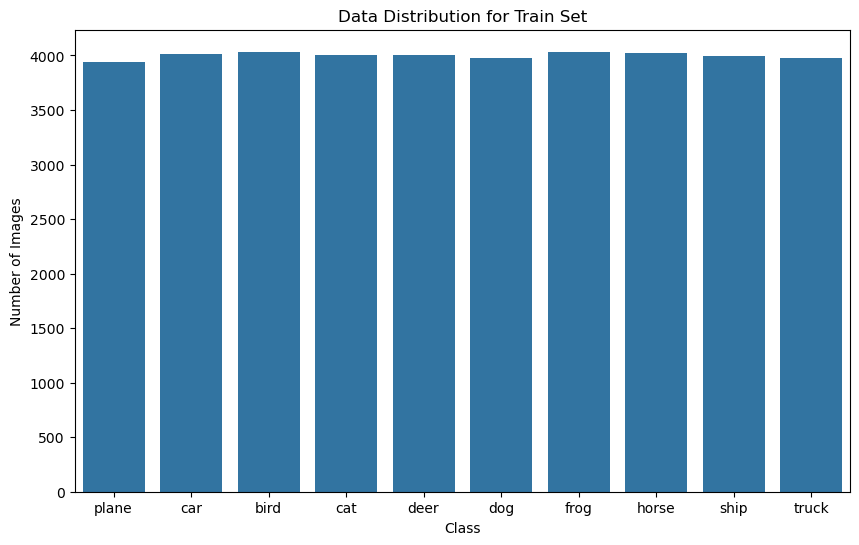

Validation Set Data Distribution:


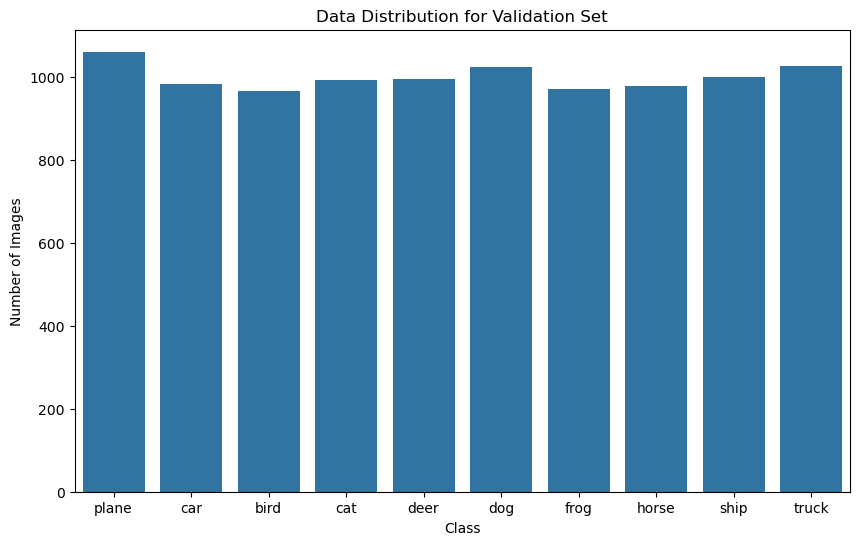

Test Set Data Distribution:


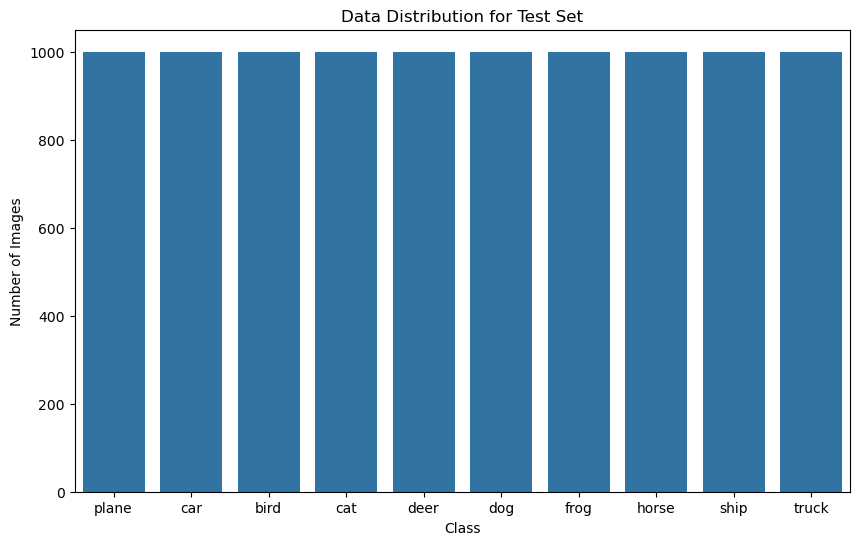

Train Set: 5 Images Per Class


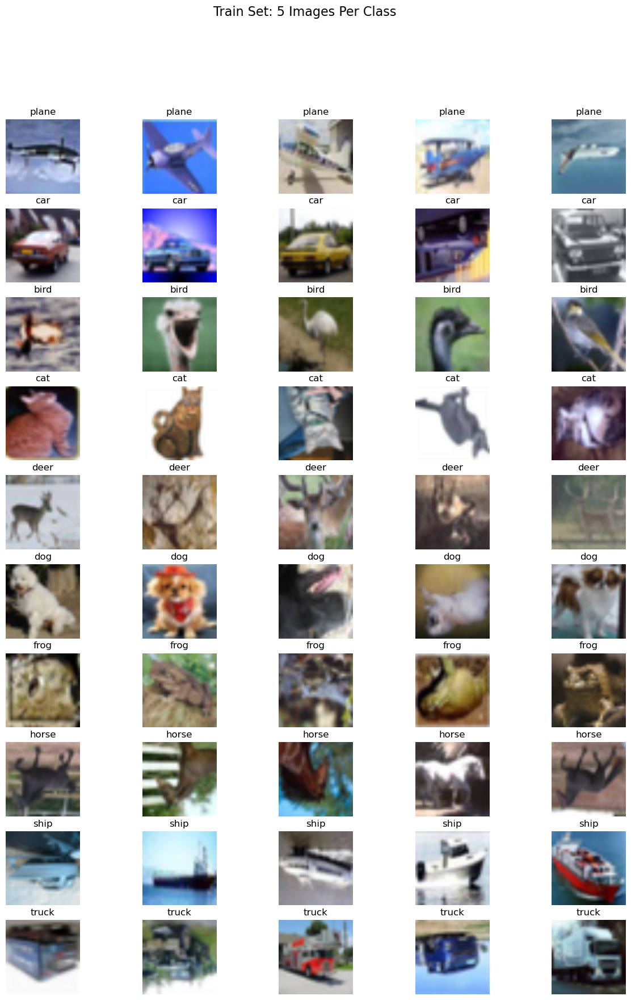

Validation Set: 5 Images Per Class


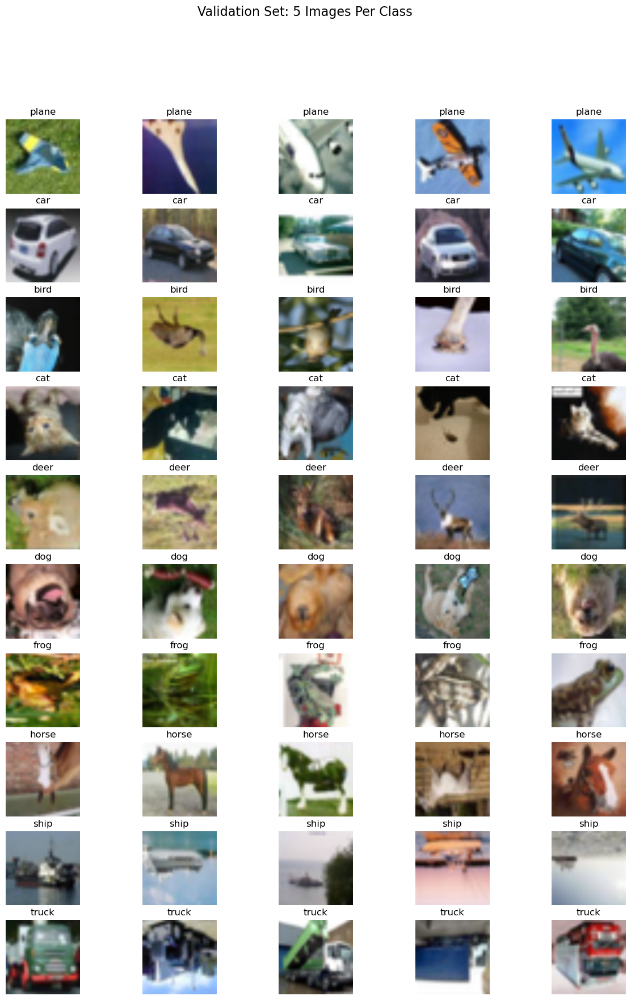

Test Set: 5 Images Per Class


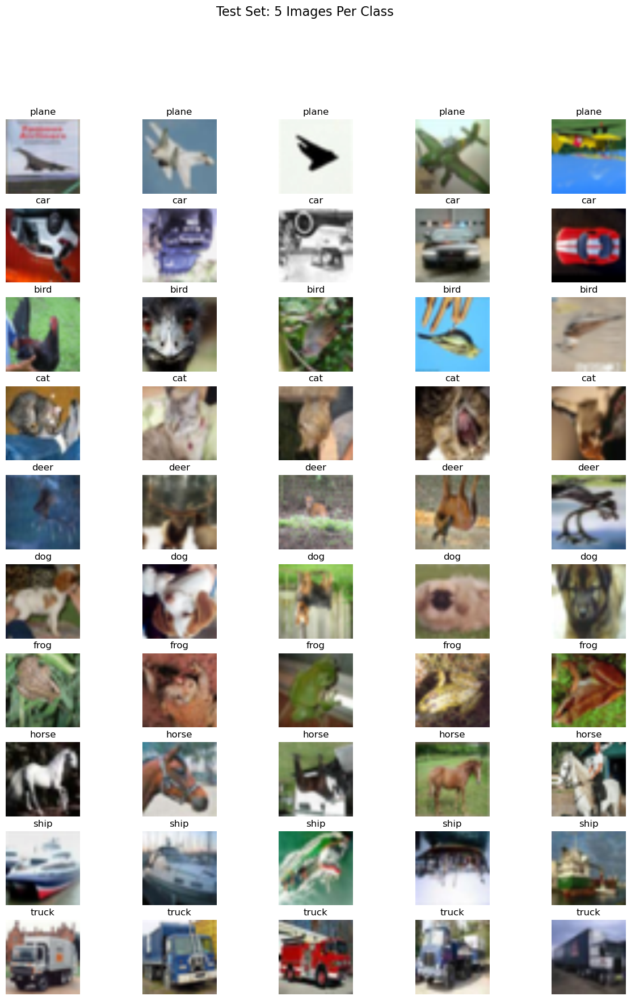


Train Set Metrics:
Total Number of Images: 40000
Number of Images per Class: {0: 3939, 1: 4016, 2: 4034, 3: 4008, 4: 4005, 5: 3975, 6: 4029, 7: 4022, 8: 3999, 9: 3973}
Total Image Size (in pixels): 1966080000
Average Image Size (in pixels): 49152.00
Total Size of Images (in bytes): 7500.00 MB
Image Resolution (Height x Width x Channels): 3 x 128 x 128

Validation Set Metrics:
Total Number of Images: 10000
Number of Images per Class: {0: 1061, 1: 984, 2: 966, 3: 992, 4: 995, 5: 1025, 6: 971, 7: 978, 8: 1001, 9: 1027}
Total Image Size (in pixels): 491520000
Average Image Size (in pixels): 49152.00
Total Size of Images (in bytes): 1875.00 MB
Image Resolution (Height x Width x Channels): 3 x 128 x 128

Test Set Metrics:
Total Number of Images: 10000
Number of Images per Class: {0: 1000, 1: 1000, 2: 1000, 3: 1000, 4: 1000, 5: 1000, 6: 1000, 7: 1000, 8: 1000, 9: 1000}
Total Image Size (in pixels): 491520000
Average Image Size (in pixels): 49152.00
Total Size of Images (in bytes): 1875.00 MB

In [18]:
# Load data
trainloader, validloader, testloader = prepare_data()
perform_eda(trainloader, validloader, testloader)

### Step 10: Create the base models and train them

********************** Begin Calculations **********************


/storage/ice1/1/2/spadmanabha3/satkp/BigData/assignment4/conda/bda_4/lib/python3.9/site-packages/torch/utils/data/dataloader.py:478: UserWarning: This DataLoader will create 2 worker processes in total. Our suggested max number of worker in current system is 1, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Epoch [1/5] Training Loss: 0.622849 | Training Accuracy: 78.3500% | Training Time: 93.23 seconds
#-----------------------------------------------------------------------------------
Epoch [1/5] Validation Loss: 0.459185 | Validation Accuracy: 84.2600%
#-----------------------------------------------------------------------------------
Epoch [2/5] Training Loss: 0.403372 | Training Accuracy: 85.9675% | Training Time: 66.93 seconds
#-----------------------------------------------------------------------------------
Epoch [2/5] Validation Loss: 0.407899 | Validation Accuracy: 86.0700%
#-----------------------------------------------------------------------------------
Epoch [3/5] Training Loss: 0.315432 | Training Accuracy: 88.9925% | Training Time: 66.35 seconds
#-----------------------------------------------------------------------------------
Epoch [3/5] Validation Loss: 0.382577 | Validation Accuracy: 86.9200%
#-------------------------------------------------------------------------

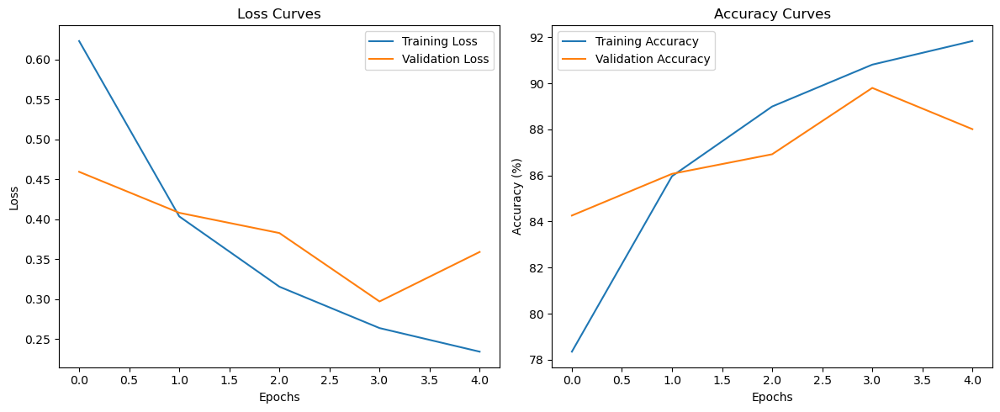

********************** End Calculations **********************

Model denseNet saved!
********************** Begin Calculations **********************
Epoch [1/5] Training Loss: 1.124592 | Training Accuracy: 61.2375% | Training Time: 46.71 seconds
#-----------------------------------------------------------------------------------
Epoch [1/5] Validation Loss: 1.084618 | Validation Accuracy: 62.0300%
#-----------------------------------------------------------------------------------
Epoch [2/5] Training Loss: 0.752593 | Training Accuracy: 75.1850% | Training Time: 45.18 seconds
#-----------------------------------------------------------------------------------
Epoch [2/5] Validation Loss: 0.763420 | Validation Accuracy: 75.1100%
#-----------------------------------------------------------------------------------
Epoch [3/5] Training Loss: 0.626935 | Training Accuracy: 79.6200% | Training Time: 45.14 seconds
#-----------------------------------------------------------------------------

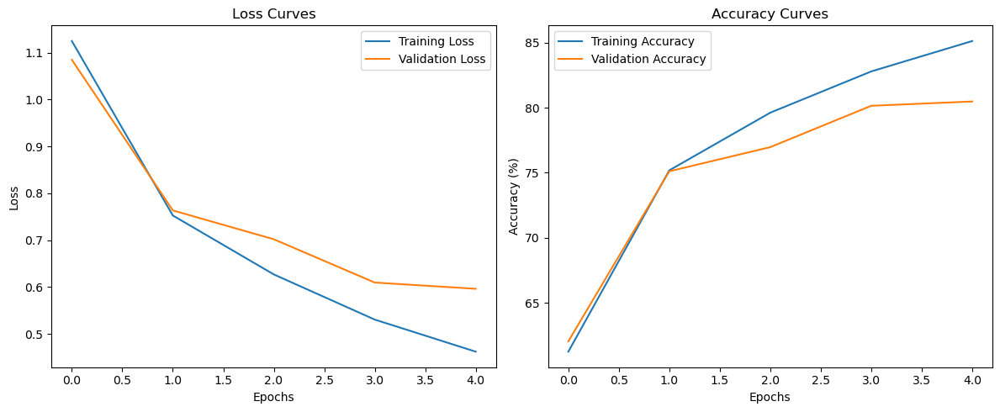

********************** End Calculations **********************

Model vgg19 saved!
********************** Begin Calculations **********************
Epoch [1/5] Training Loss: 0.872297 | Training Accuracy: 69.3850% | Training Time: 54.50 seconds
#-----------------------------------------------------------------------------------
Epoch [1/5] Validation Loss: 0.896401 | Validation Accuracy: 70.6600%
#-----------------------------------------------------------------------------------
Epoch [2/5] Training Loss: 0.546370 | Training Accuracy: 81.1675% | Training Time: 54.45 seconds
#-----------------------------------------------------------------------------------
Epoch [2/5] Validation Loss: 0.509700 | Validation Accuracy: 81.9800%
#-----------------------------------------------------------------------------------
Epoch [3/5] Training Loss: 0.433363 | Training Accuracy: 84.9000% | Training Time: 54.16 seconds
#--------------------------------------------------------------------------------

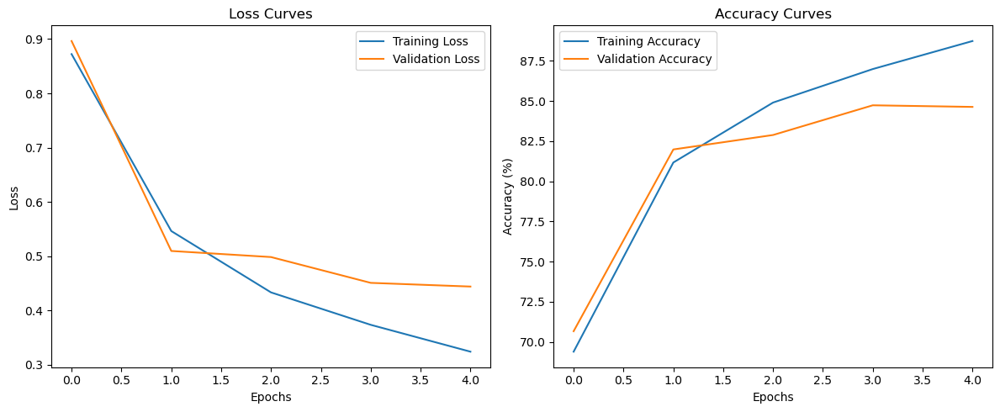

********************** End Calculations **********************

Model resNet saved!
********************** Begin Calculations **********************
Epoch [1/5] Training Loss: 0.629606 | Training Accuracy: 77.9000% | Training Time: 26.21 seconds
#-----------------------------------------------------------------------------------
Epoch [1/5] Validation Loss: 0.499102 | Validation Accuracy: 82.9900%
#-----------------------------------------------------------------------------------
Epoch [2/5] Training Loss: 0.419401 | Training Accuracy: 85.6675% | Training Time: 25.40 seconds
#-----------------------------------------------------------------------------------
Epoch [2/5] Validation Loss: 0.399710 | Validation Accuracy: 86.6800%
#-----------------------------------------------------------------------------------
Epoch [3/5] Training Loss: 0.349527 | Training Accuracy: 87.9550% | Training Time: 25.25 seconds
#-------------------------------------------------------------------------------

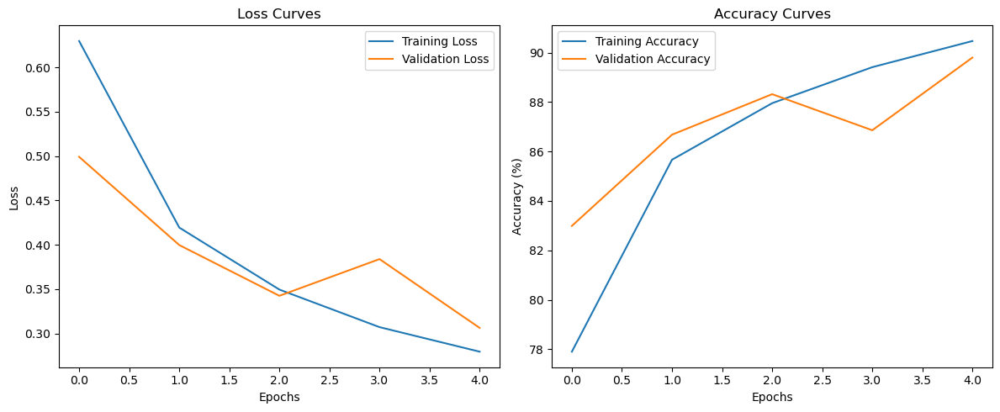

********************** End Calculations **********************

Model mobileNetV2 saved!


In [19]:
# Load the individual models
denseNet = load_model(DenseNet)
vgg19 = load_model(VGG19)
resNet = load_model(ResNet)
mobileNetV2 = load_model(MobileNetV2)

# Configure optimizers for each model
optimizer1 = configure_optimizer(denseNet)
optimizer2 = configure_optimizer(vgg19)
optimizer3 = configure_optimizer(resNet)
optimizer4 = configure_optimizer(mobileNetV2)

# Train and save models
train_and_save_model(denseNet, criterion, optimizer1, epoch_number, trainloader, validloader, "denseNet")
train_and_save_model(vgg19, criterion, optimizer2, epoch_number, trainloader, validloader, "vgg19")
train_and_save_model(resNet, criterion, optimizer3, epoch_number, trainloader, validloader, "resNet")
train_and_save_model(mobileNetV2, criterion, optimizer4, epoch_number, trainloader, validloader, "mobileNetV2")



### Step 11: Peform Testing of base models

Note: We can load the models (in case jupyter crashes for whatever reason) 

Model denseNet loaded!
Model vgg19 loaded!
Model resNet loaded!
Model mobileNetV2 loaded!
Testing DenseNet
********************** Begin Calculations **********************


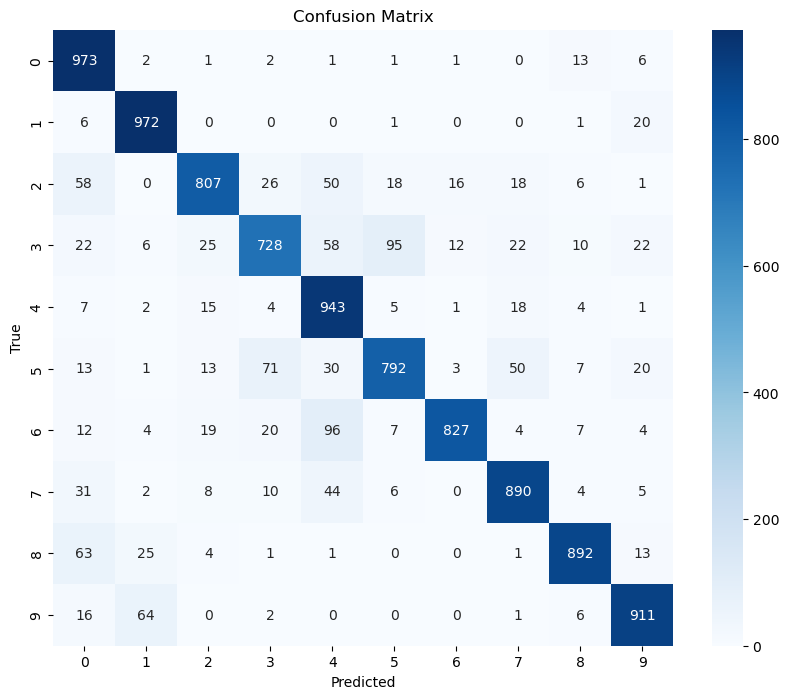

Test Loss: 0.401965 | Test Accuracy: 87.3500%
********************** End Calculations **********************

Testing VGG19
********************** Begin Calculations **********************


/storage/ice1/1/2/spadmanabha3/satkp/BigData/assignment4/conda/bda_4/lib/python3.9/site-packages/torch/utils/data/dataloader.py:478: UserWarning: This DataLoader will create 2 worker processes in total. Our suggested max number of worker in current system is 1, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


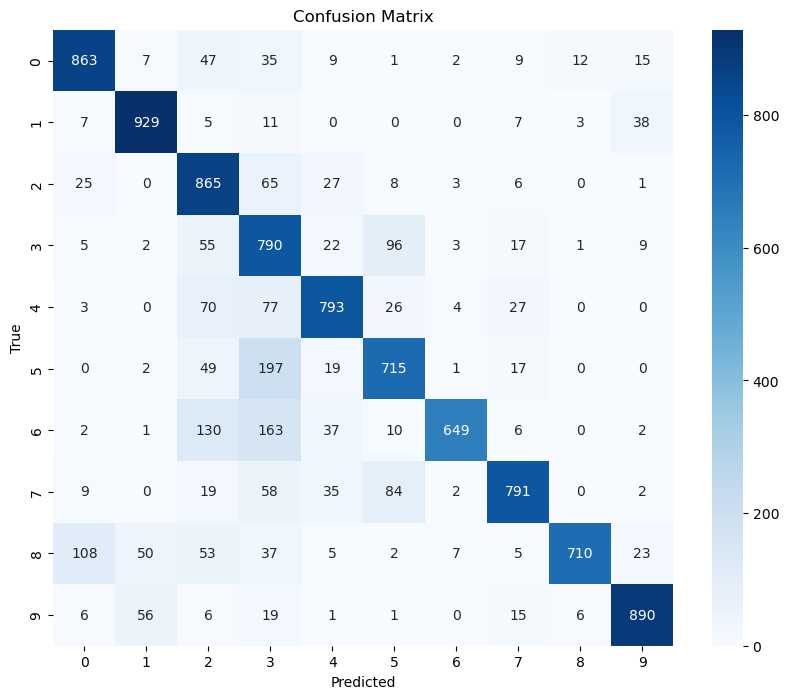

Test Loss: 0.620401 | Test Accuracy: 79.9500%
********************** End Calculations **********************

Testing ResNet
********************** Begin Calculations **********************


/storage/ice1/1/2/spadmanabha3/satkp/BigData/assignment4/conda/bda_4/lib/python3.9/site-packages/torch/utils/data/dataloader.py:478: UserWarning: This DataLoader will create 2 worker processes in total. Our suggested max number of worker in current system is 1, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


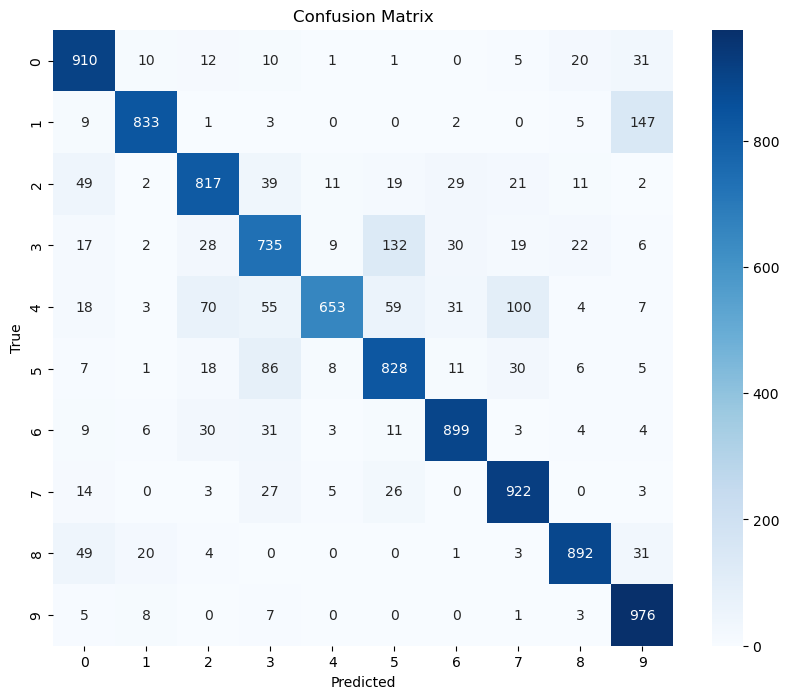

Test Loss: 0.445471 | Test Accuracy: 84.6500%
********************** End Calculations **********************

Testing MobileNetV2
********************** Begin Calculations **********************


/storage/ice1/1/2/spadmanabha3/satkp/BigData/assignment4/conda/bda_4/lib/python3.9/site-packages/torch/utils/data/dataloader.py:478: UserWarning: This DataLoader will create 2 worker processes in total. Our suggested max number of worker in current system is 1, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


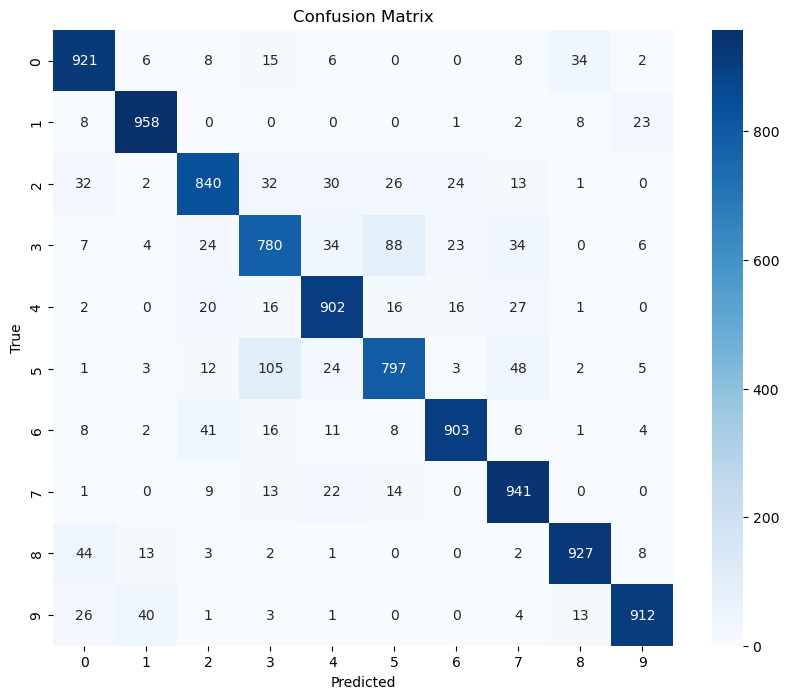

Test Loss: 0.333988 | Test Accuracy: 88.8100%
********************** End Calculations **********************



In [20]:
denseNet = load_saved_model("denseNet")
vgg19 = load_saved_model("vgg19")
resNet = load_saved_model("resNet")
mobileNetV2 = load_saved_model("mobileNetV2")


print("Testing DenseNet")
average_loss_denseNet, accuracy_denseNet, _, _, wrong_examples_denseNet, true_labels_denseNet, focal_denseNet = test_model(denseNet, testloader, criterion)

print("Testing VGG19")
average_loss_vgg19, accuracy_vgg19, _, _, wrong_examples_vgg19, true_labels_vgg19, focal_vgg19 = test_model(vgg19, testloader, criterion)

print("Testing ResNet")
average_loss_resNet, accuracy_resNet, _, _, wrong_examples_resNet, true_labels_resNet, focal_resNet = test_model(resNet, testloader, criterion)

print("Testing MobileNetV2")
average_loss_mobileNetV2, accuracy_mobileNetV2, _, _, wrong_examples_mobileNetV2, true_labels_mobileNetV2, focal_mobileNetV2 = test_model(mobileNetV2, testloader, criterion)

### Step 12: Compare performance of other models by keeping VGG19 as focal model

Section 5 -> use wrongly predicted examples of VGG19 as examples for testing

In [21]:
test_models_1 = [denseNet, resNet, mobileNetV2]
test_models_names = ["DenseNet", "ResNet", "MobileNetV2"]
focal_model_name = ["VGG19"]


statistics_df, case_images = compare_models(test_models_1, wrong_examples_vgg19, true_labels_vgg19, focal_vgg19)


                         Scenario  Count
0  Model 1 Correct, 2 and 3 Wrong    138
1  Model 2 Correct, 1 and 3 Wrong    117
2  Model 3 Correct, 1 and 2 Wrong    111
3  Model 1 and 2 Correct, 3 Wrong    137
4  Model 1 and 3 Correct, 2 Wrong    226
5  Model 2 and 3 Correct, 1 Wrong    165
6              All Models Correct    813
7                All Models Wrong    298
Total wrong examples in focal model 1 :  2005
Case: Model 1 Correct, 2 and 3 Wrong - Number of images: 138


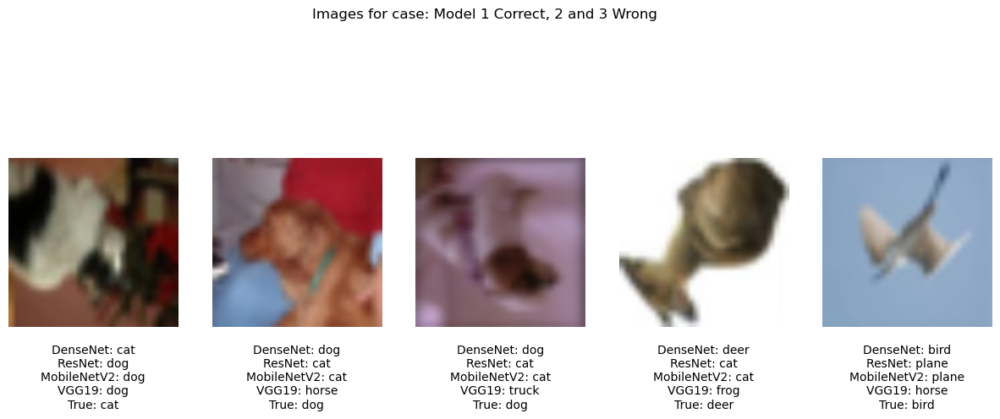

Case: Model 2 Correct, 1 and 3 Wrong - Number of images: 117


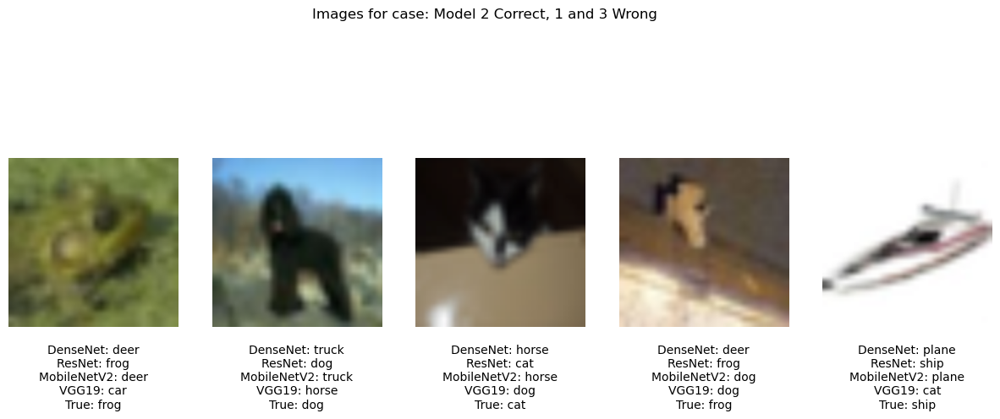

Case: Model 3 Correct, 1 and 2 Wrong - Number of images: 111


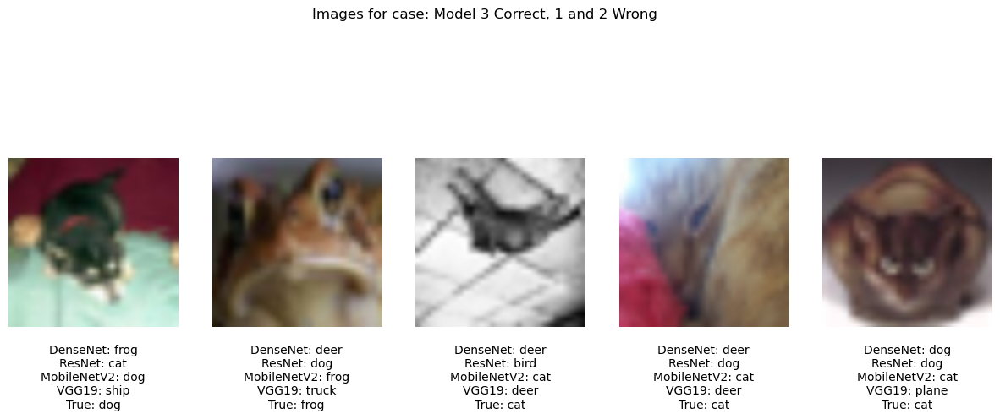

Case: Model 1 and 2 Correct, 3 Wrong - Number of images: 137


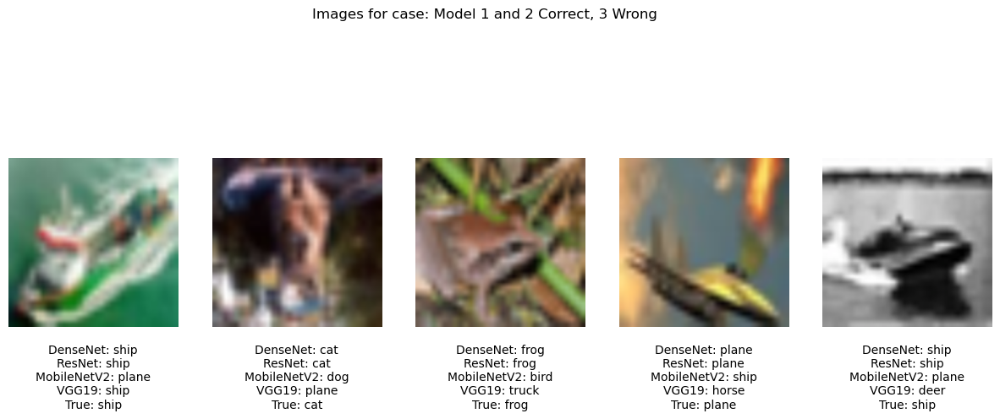

Case: Model 1 and 3 Correct, 2 Wrong - Number of images: 226


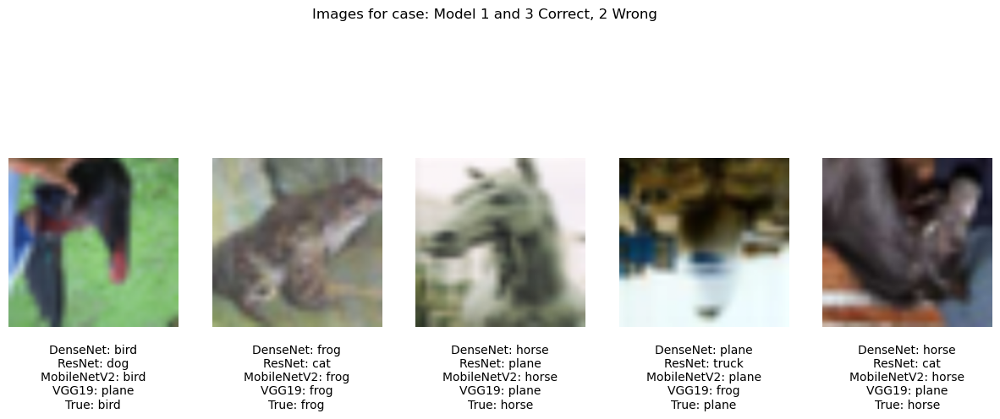

Case: Model 2 and 3 Correct, 1 Wrong - Number of images: 165


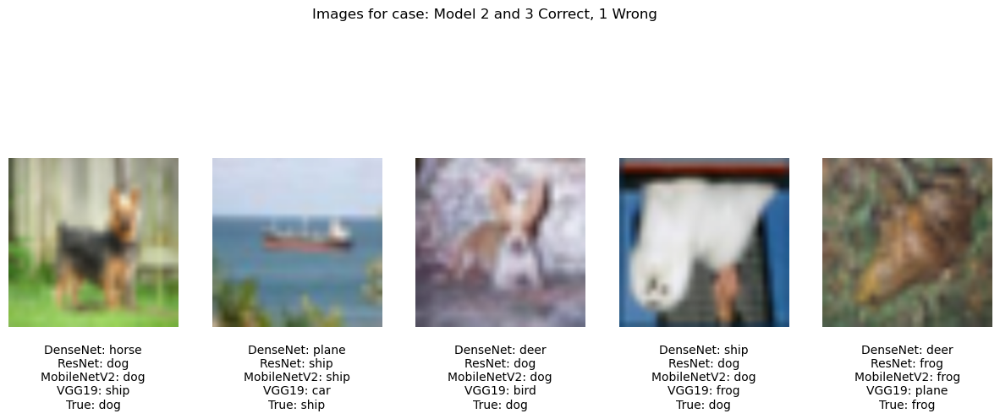

Case: All Models Correct - Number of images: 813


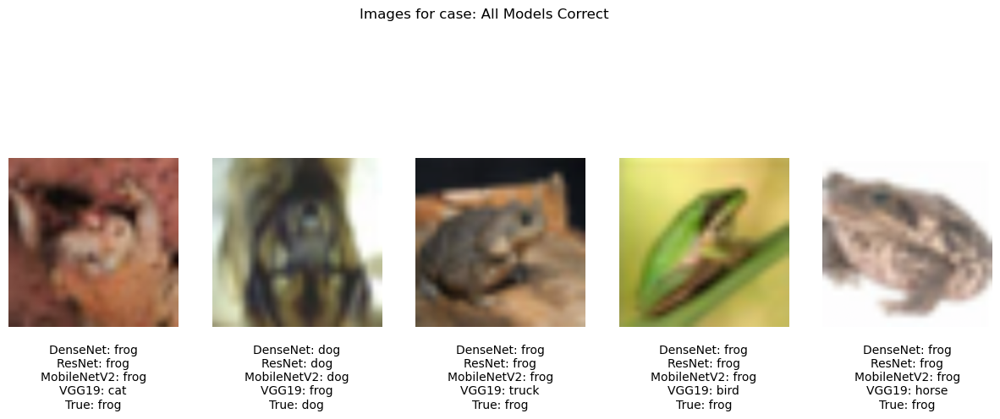

Case: All Models Wrong - Number of images: 298


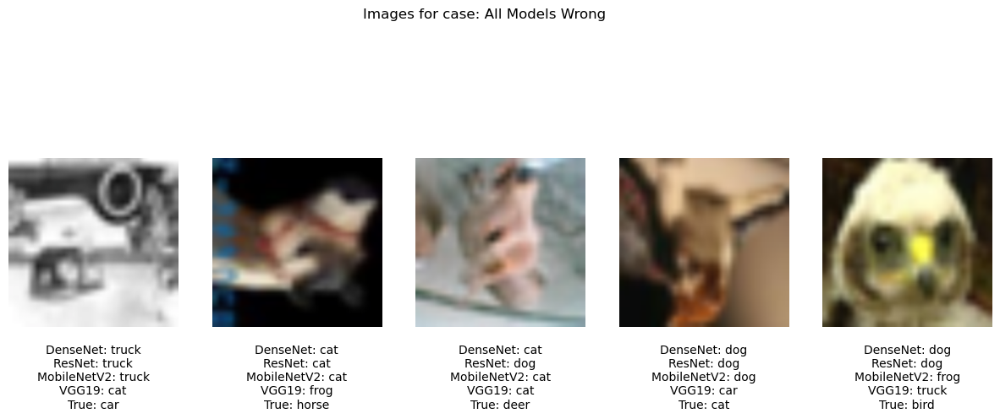

In [22]:
print(statistics_df)
print("Total wrong examples in focal model 1 : ",len(wrong_examples_vgg19))
display_case_images(case_images)

### Step 13: Run the ensemble predictions over all permutations

This will determine which ensemble is the best (assuming we can choose 3)

Model denseNet loaded!
Model vgg19 loaded!
Model resNet loaded!
Model mobileNetV2 loaded!
Testing Ensemble 123 (DenseNet, VGG19, ResNet)


/storage/ice1/1/2/spadmanabha3/satkp/BigData/assignment4/conda/bda_4/lib/python3.9/site-packages/torch/utils/data/dataloader.py:478: UserWarning: This DataLoader will create 2 worker processes in total. Our suggested max number of worker in current system is 1, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Ensemble Test Accuracy: 88.9000%


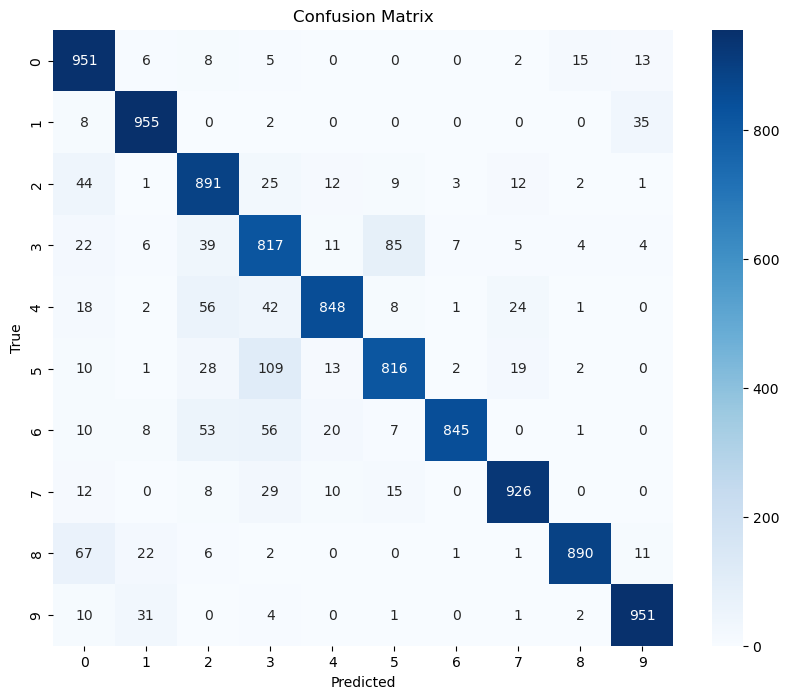

Testing Ensemble 124 (DenseNet, VGG19, MobileNetV2)


/storage/ice1/1/2/spadmanabha3/satkp/BigData/assignment4/conda/bda_4/lib/python3.9/site-packages/torch/utils/data/dataloader.py:478: UserWarning: This DataLoader will create 2 worker processes in total. Our suggested max number of worker in current system is 1, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Ensemble Test Accuracy: 89.9700%


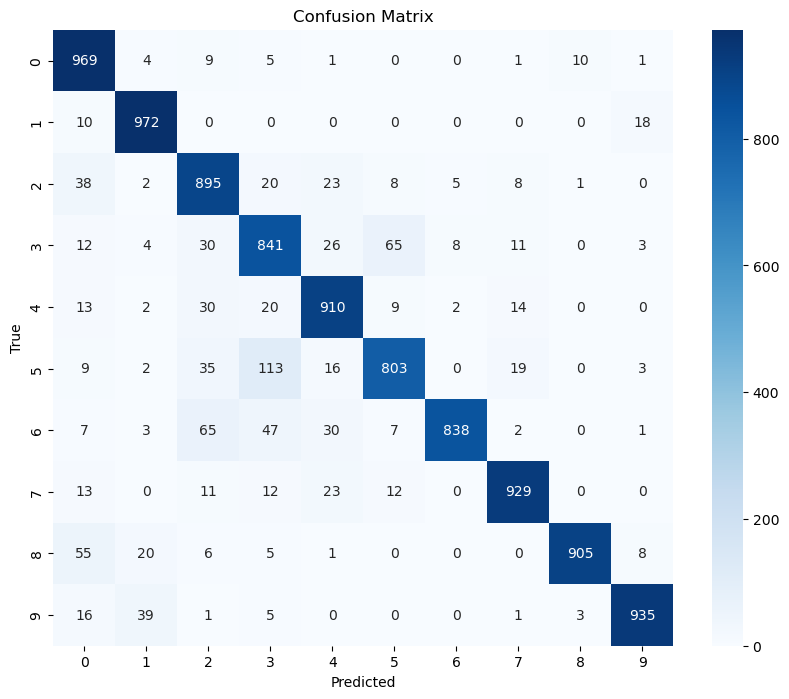

Testing Ensemble 134 (DenseNet, ResNet, MobileNetV2)


/storage/ice1/1/2/spadmanabha3/satkp/BigData/assignment4/conda/bda_4/lib/python3.9/site-packages/torch/utils/data/dataloader.py:478: UserWarning: This DataLoader will create 2 worker processes in total. Our suggested max number of worker in current system is 1, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Ensemble Test Accuracy: 90.5700%


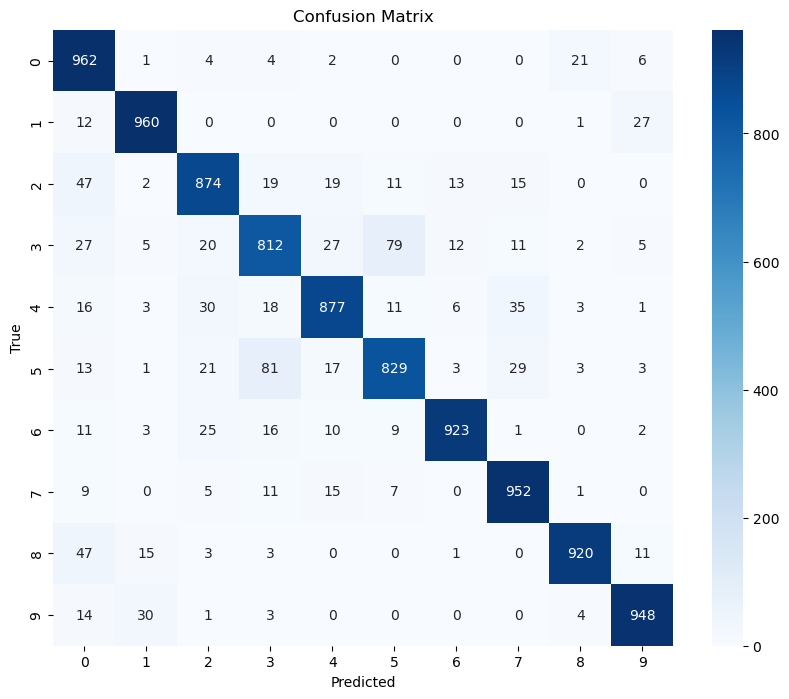

Testing Ensemble 234 (VGG19, ResNet, MobileNetV2)


/storage/ice1/1/2/spadmanabha3/satkp/BigData/assignment4/conda/bda_4/lib/python3.9/site-packages/torch/utils/data/dataloader.py:478: UserWarning: This DataLoader will create 2 worker processes in total. Our suggested max number of worker in current system is 1, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Ensemble Test Accuracy: 89.0800%


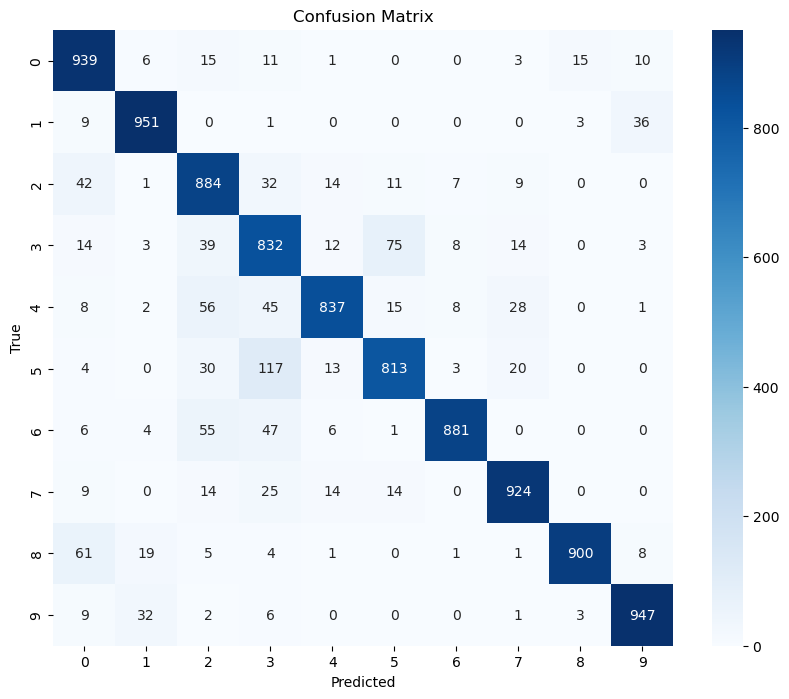

In [23]:
run_all_ensembles()

# OPTIONAL : DATASET 2 - MNIST

We can use existing modular functions for the MNIST dataset, only data preprocessing changes

In [24]:
def add_noise(tensor):
    """Function to add random noise to the input tensor."""
    noise = torch.randn_like(tensor) * 0.25
    #noisy_tensor = tensor + noise
    #noisy_tensor = torch.clamp(noisy_tensor, 0, 1)
    return tensor + noise

def prepare_data_mnist(batch_size=128, valid_ratio=0.2):
    transform = transforms.Compose([
        transforms.Resize((64, 64)), 
        transforms.RandomHorizontalFlip(),
        transforms.RandomVerticalFlip(),
        transforms.ToTensor(),
        transforms.Lambda(add_noise),
        transforms.Normalize((0.1307,), (0.3081,))  
    ])

    # Load dataset
    full_trainset_mnist = torchvision.datasets.MNIST(root='./data_mnist', train=True, download=True, transform=transform)
    testset_mnist = torchvision.datasets.MNIST(root='./data_mnist', train=False, download=True, transform=transform)
    
    # Mislabel some training data as i got 98% accuracies
    for i in range(len(full_trainset_mnist)):
        if random.random() < 0.2:  # 20% mislabeling rate
            original_label = full_trainset_mnist.targets[i]
            
            new_label = random.choice([j for j in range(10) if j != original_label])
            full_trainset_mnist.targets[i] = new_label
            
    for i in range(len(testset_mnist)):
        if random.random() < 0.2:  # 20% mislabeling rate
            original_label = testset_mnist.targets[i]
            
            new_label = random.choice([j for j in range(10) if j != original_label])
            testset_mnist.targets[i] = new_label
            
    # Train-validation split
    train_size = int((1 - valid_ratio) * len(full_trainset_mnist))
    valid_size = len(full_trainset_mnist) - train_size
    trainset_mnist, validset_mnist = random_split(full_trainset_mnist, [train_size, valid_size])

    # Data loaders
    trainloader_mnist = torch.utils.data.DataLoader(trainset_mnist, batch_size=batch_size, shuffle=True, num_workers=2)
    validloader_mnist = torch.utils.data.DataLoader(validset_mnist, batch_size=batch_size, shuffle=False, num_workers=2)
    testloader_mnist = torch.utils.data.DataLoader(testset_mnist, batch_size=batch_size, shuffle=False, num_workers=2)

    return trainloader_mnist, validloader_mnist, testloader_mnist

def perform_eda_mnist(trainloader, validloader, testloader, class_names=None):
    if class_names is None:
        class_names = [str(i) for i in range(10)]  # MNIST classes: digits 0 to 9

    # Calculate statistics for train, validation, and test sets
    def dataset_statistics(dataloader, name="Dataset"):
        total_images = 0
        class_counts = np.zeros(10, dtype=int)
        total_image_size = 0

        for images, labels in dataloader:
            total_images += images.size(0)  
            total_image_size += images.nelement()  
            for label in labels:
                class_counts[label] += 1

        image_resolution = list(images[0].size())
        total_size_in_bytes = total_image_size * 4 / (1024 ** 2)  

        # Print detailed stats
        print(f"--- {name} ---")
        print(f"Total images: {total_images}")
        print(f"Number of Images per Class: {dict(zip(class_names, class_counts))}")
        print(f"Total Image Size (in pixels): {total_image_size}")
        print(f"Average Image Size (in pixels): {total_image_size / total_images:.2f}")
        print(f"Total Size of Images (in bytes): {total_size_in_bytes:.2f} MB")
        print(f"Image Resolution (Height x Width x Channels): {' x '.join(map(str, image_resolution))}")

        # Plot bar graph of class distribution
        plt.figure(figsize=(8, 5))
        plt.bar(class_names, class_counts, color='skyblue')
        plt.xlabel('Classes')
        plt.ylabel('Number of Images')
        plt.title(f'Class Distribution in {name}')
        plt.show()

    # Display 5 images per class
    def display_images_per_class(dataloader, num_images=5, name="Dataset"):
        print(f"\nDisplaying {num_images} images per class from {name}")
        images_per_class = {i: [] for i in range(10)}
        for images, labels in dataloader:
            for img, lbl in zip(images, labels):
                if len(images_per_class[lbl.item()]) < num_images:
                    images_per_class[lbl.item()].append(img)
            if all(len(images_per_class[i]) == num_images for i in range(10)):
                break
        
        # Plot images per class
        fig, axes = plt.subplots(10, num_images, figsize=(num_images*2, 20))
        for class_idx, imgs in images_per_class.items():
            for img_idx, img in enumerate(imgs):
                img = img.squeeze()  
                axes[class_idx, img_idx].imshow(img.numpy(), cmap="gray")
                axes[class_idx, img_idx].axis('off')
                if img_idx == 0:
                    axes[class_idx, img_idx].set_title(f"Class {class_names[class_idx]}")
        plt.show()

    # Print image size
    def check_image_size(dataloader):
        for images, _ in dataloader:
            print(f"Image size: {images[0].size()}")
            break

    # Display statistics
    print("Train set statistics:")
    dataset_statistics(trainloader, name="Train set")
    display_images_per_class(trainloader, name="Train set")
    check_image_size(trainloader)

    print("\nValidation set statistics:")
    dataset_statistics(validloader, name="Validation set")
    display_images_per_class(validloader, name="Validation set")

    print("\nTest set statistics:")
    dataset_statistics(testloader, name="Test set")
    display_images_per_class(testloader, name="Test set")

Train set statistics:


/storage/ice1/1/2/spadmanabha3/satkp/BigData/assignment4/conda/bda_4/lib/python3.9/site-packages/torch/utils/data/dataloader.py:478: UserWarning: This DataLoader will create 2 worker processes in total. Our suggested max number of worker in current system is 1, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


--- Train set ---
Total images: 48000
Number of Images per Class: {'0': 4816, '1': 5219, '2': 4798, '3': 4827, '4': 4692, '5': 4422, '6': 4791, '7': 4972, '8': 4721, '9': 4742}
Total Image Size (in pixels): 196608000
Average Image Size (in pixels): 4096.00
Total Size of Images (in bytes): 750.00 MB
Image Resolution (Height x Width x Channels): 1 x 64 x 64


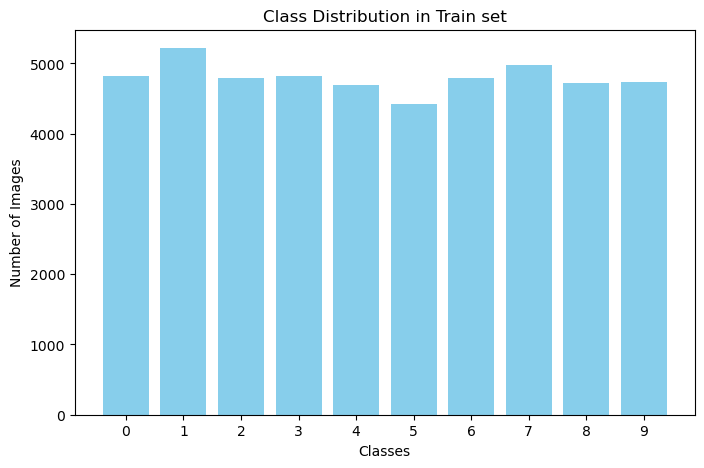


Displaying 5 images per class from Train set


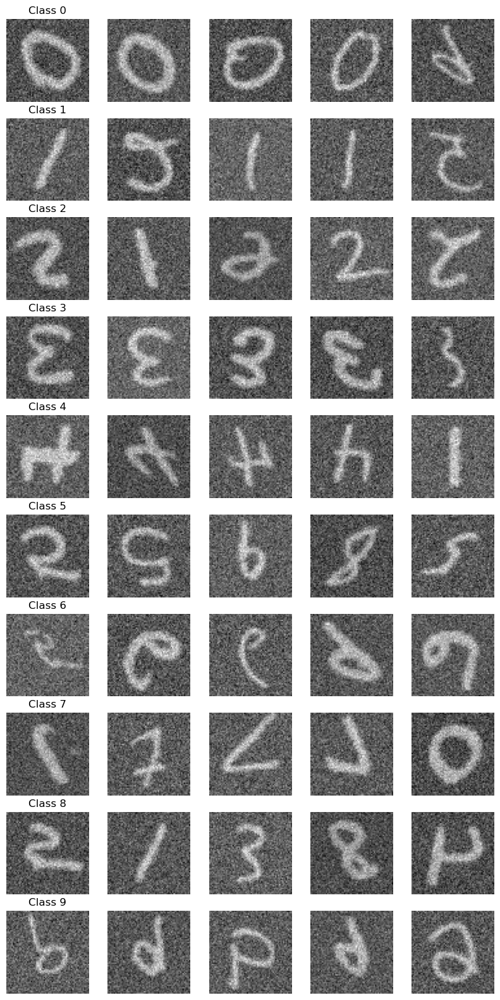

Image size: torch.Size([1, 64, 64])

Validation set statistics:
--- Validation set ---
Total images: 12000
Number of Images per Class: {'0': 1191, '1': 1314, '2': 1175, '3': 1244, '4': 1180, '5': 1144, '6': 1211, '7': 1202, '8': 1170, '9': 1169}
Total Image Size (in pixels): 49152000
Average Image Size (in pixels): 4096.00
Total Size of Images (in bytes): 187.50 MB
Image Resolution (Height x Width x Channels): 1 x 64 x 64


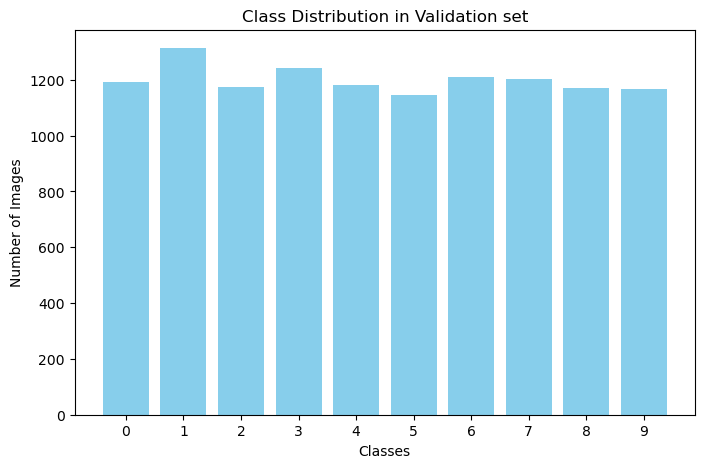


Displaying 5 images per class from Validation set


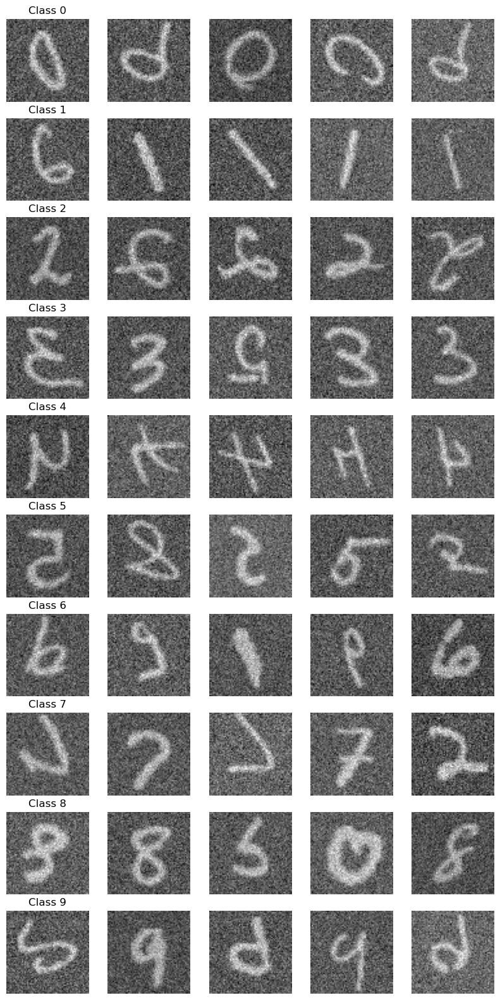


Test set statistics:
--- Test set ---
Total images: 10000
Number of Images per Class: {'0': 979, '1': 1094, '2': 1040, '3': 1010, '4': 1010, '5': 882, '6': 970, '7': 1024, '8': 978, '9': 1013}
Total Image Size (in pixels): 40960000
Average Image Size (in pixels): 4096.00
Total Size of Images (in bytes): 156.25 MB
Image Resolution (Height x Width x Channels): 1 x 64 x 64


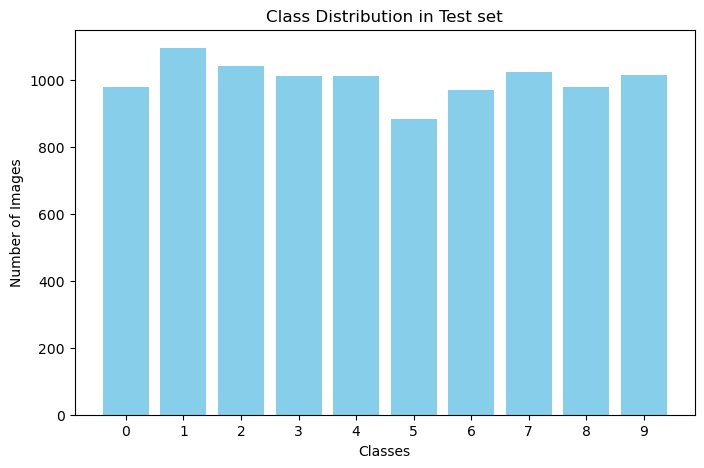


Displaying 5 images per class from Test set


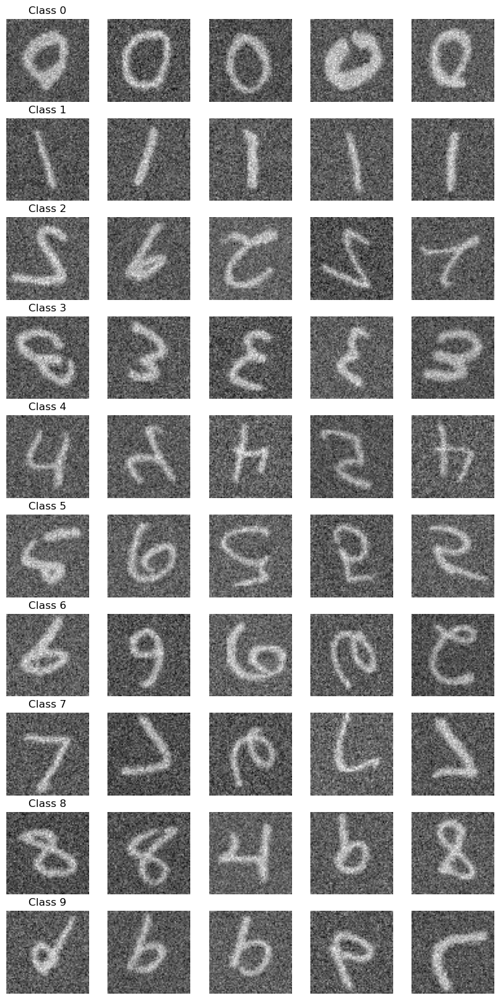

In [25]:
trainloader_mnist, validloader_mnist, testloader_mnist = prepare_data_mnist()
perform_eda_mnist(trainloader_mnist, validloader_mnist, testloader_mnist)

In [26]:


# Load models for MNIST
denseNet_MNIST = DenseNet(MNIST=True).to(device)
vgg19_MNIST = VGG19(MNIST=True).to(device)
resNet_MNIST = ResNet(MNIST=True).to(device)
mobileNetV2_MNIST = MobileNetV2(MNIST=True).to(device)

# Configure optimizers for MNIST models
epoch_number = 1
optimizer1_MNIST = configure_optimizer(denseNet_MNIST, lr = 0.0001)
optimizer2_MNIST = configure_optimizer(vgg19_MNIST, lr = 0.0001)
optimizer3_MNIST = configure_optimizer(resNet_MNIST, lr = 0.0001)
optimizer4_MNIST = configure_optimizer(mobileNetV2_MNIST, lr =0.0001)

********************** Begin Calculations **********************
Epoch [1/1] Training Loss: 1.187508 | Training Accuracy: 71.0062% | Training Time: 66.14 seconds
#-----------------------------------------------------------------------------------
Epoch [1/1] Validation Loss: 1.226497 | Validation Accuracy: 77.1167%
#-----------------------------------------------------------------------------------
Total Training Time: 72.01 seconds


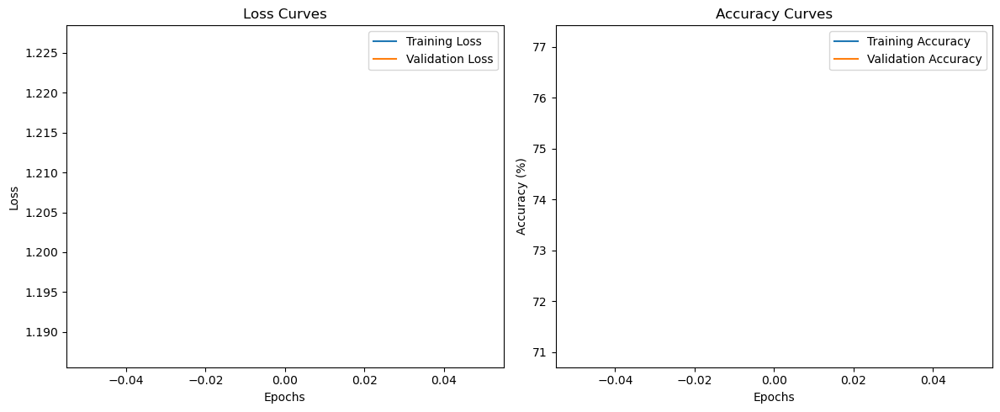

********************** End Calculations **********************

Model denseNet_MNIST saved!
********************** Begin Calculations **********************
Epoch [1/1] Training Loss: 1.172306 | Training Accuracy: 72.1500% | Training Time: 21.65 seconds
#-----------------------------------------------------------------------------------
Epoch [1/1] Validation Loss: 1.208148 | Validation Accuracy: 77.6083%
#-----------------------------------------------------------------------------------
Total Training Time: 25.41 seconds


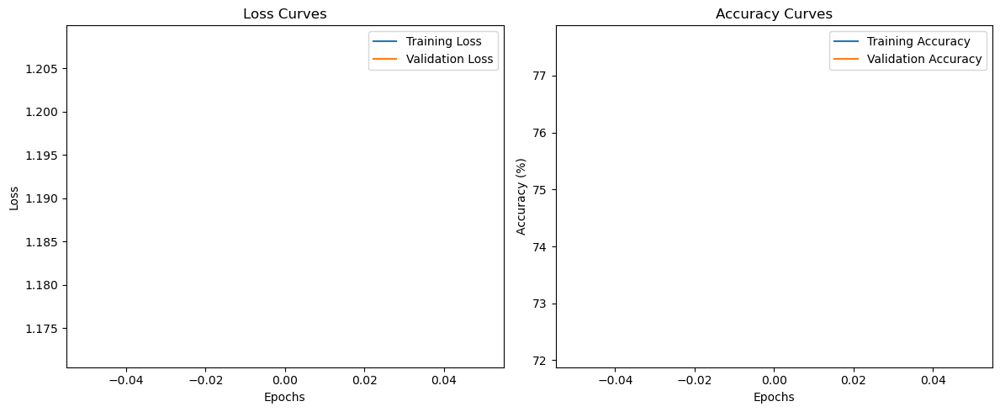

********************** End Calculations **********************

Model vgg19_MNIST saved!
********************** Begin Calculations **********************
Epoch [1/1] Training Loss: 1.159877 | Training Accuracy: 71.7375% | Training Time: 53.91 seconds
#-----------------------------------------------------------------------------------
Epoch [1/1] Validation Loss: 1.223145 | Validation Accuracy: 76.6417%
#-----------------------------------------------------------------------------------
Total Training Time: 59.66 seconds


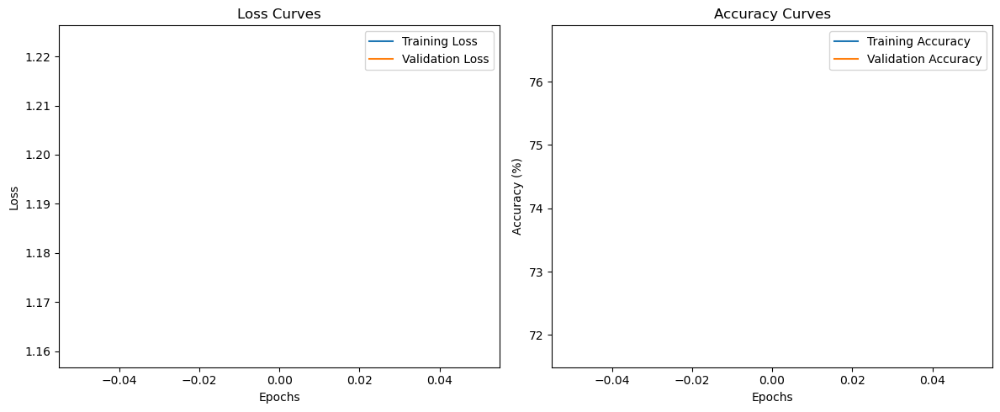

********************** End Calculations **********************

Model resNet_MNIST saved!
********************** Begin Calculations **********************
Epoch [1/1] Training Loss: 1.601177 | Training Accuracy: 50.8771% | Training Time: 17.39 seconds
#-----------------------------------------------------------------------------------
Epoch [1/1] Validation Loss: 1.458906 | Validation Accuracy: 68.7083%
#-----------------------------------------------------------------------------------
Total Training Time: 20.93 seconds


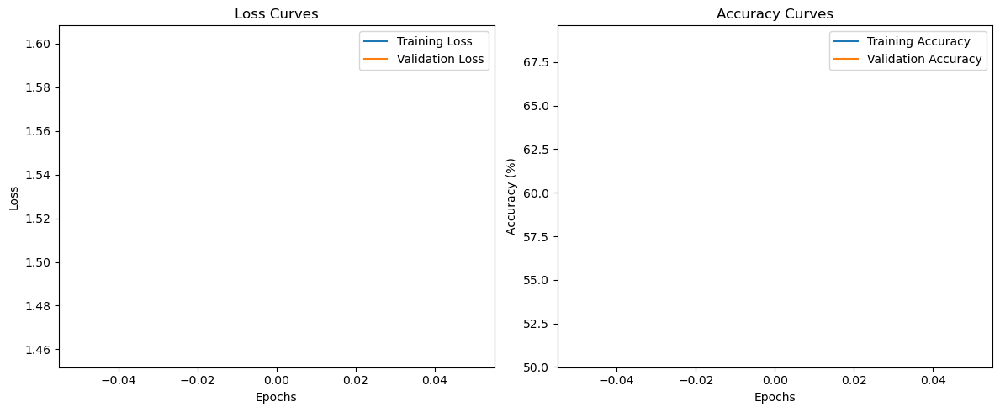

********************** End Calculations **********************

Model mobileNetV2_MNIST saved!


In [27]:
# Train and save MNIST models
train_and_save_model(denseNet_MNIST, criterion, optimizer1_MNIST, epoch_number, trainloader_mnist, validloader_mnist, "denseNet_MNIST")
train_and_save_model(vgg19_MNIST, criterion, optimizer2_MNIST, epoch_number, trainloader_mnist, validloader_mnist, "vgg19_MNIST")
train_and_save_model(resNet_MNIST, criterion, optimizer3_MNIST, epoch_number, trainloader_mnist, validloader_mnist, "resNet_MNIST")
train_and_save_model(mobileNetV2_MNIST, criterion, optimizer4_MNIST, epoch_number, trainloader_mnist, validloader_mnist, "mobileNetV2_MNIST")

Testing DenseNet_MNIST
********************** Begin Calculations **********************


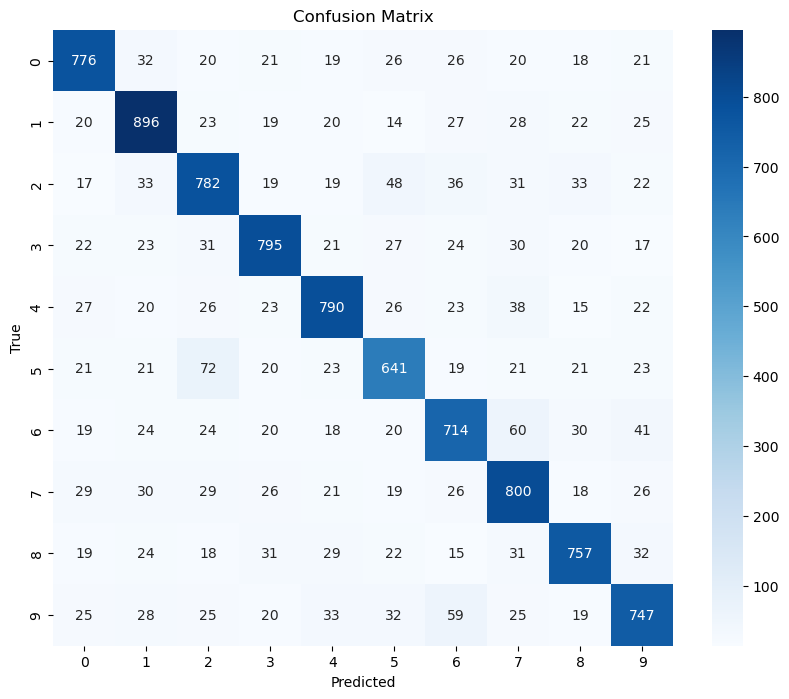

Test Loss: 1.040335 | Test Accuracy: 76.9800%
********************** End Calculations **********************

Testing VGG19_MNIST
********************** Begin Calculations **********************


/storage/ice1/1/2/spadmanabha3/satkp/BigData/assignment4/conda/bda_4/lib/python3.9/site-packages/torch/utils/data/dataloader.py:478: UserWarning: This DataLoader will create 2 worker processes in total. Our suggested max number of worker in current system is 1, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


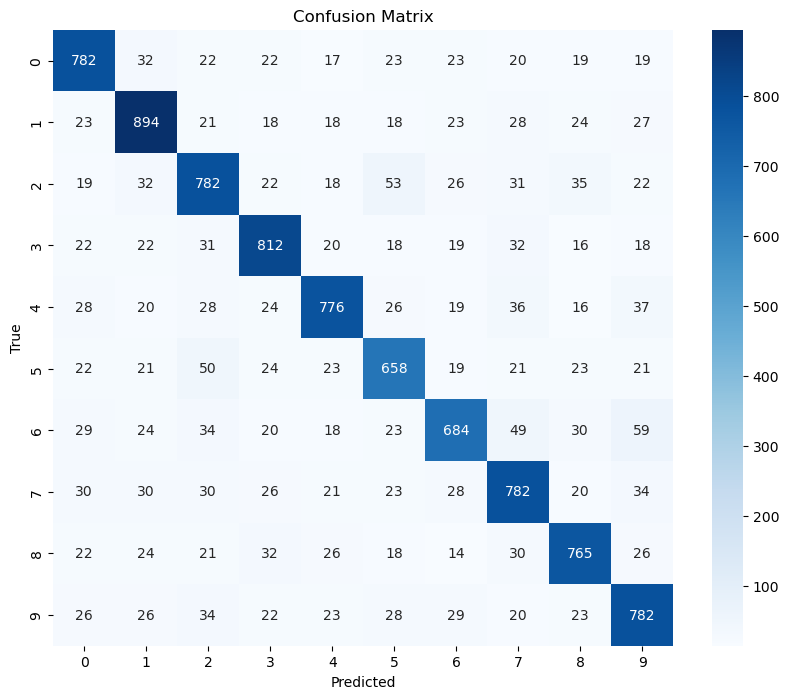

Test Loss: 1.031675 | Test Accuracy: 77.1700%
********************** End Calculations **********************

Testing ResNet_MNIST
********************** Begin Calculations **********************


/storage/ice1/1/2/spadmanabha3/satkp/BigData/assignment4/conda/bda_4/lib/python3.9/site-packages/torch/utils/data/dataloader.py:478: UserWarning: This DataLoader will create 2 worker processes in total. Our suggested max number of worker in current system is 1, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


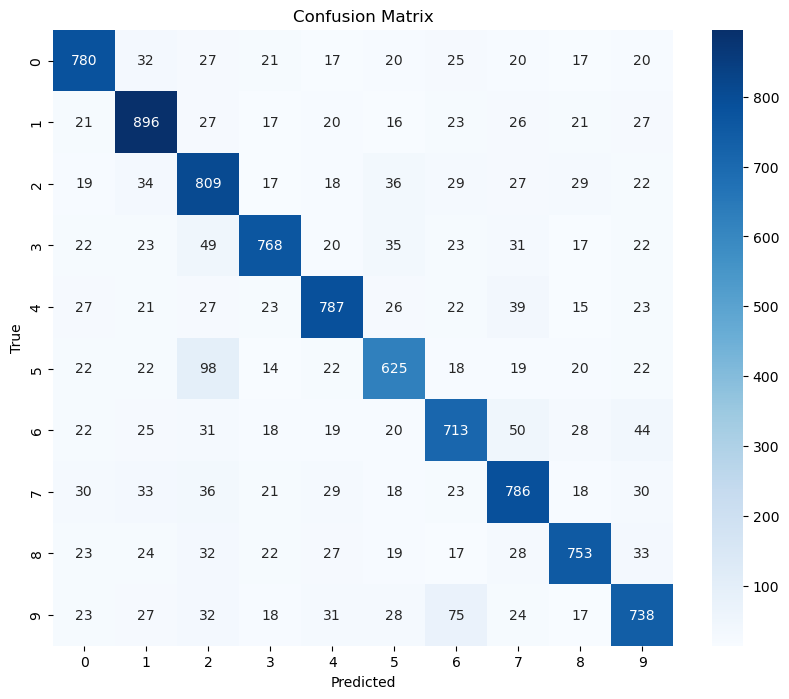

Test Loss: 1.032475 | Test Accuracy: 76.5500%
********************** End Calculations **********************

Testing MobileNetV2_MNIST
********************** Begin Calculations **********************


/storage/ice1/1/2/spadmanabha3/satkp/BigData/assignment4/conda/bda_4/lib/python3.9/site-packages/torch/utils/data/dataloader.py:478: UserWarning: This DataLoader will create 2 worker processes in total. Our suggested max number of worker in current system is 1, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


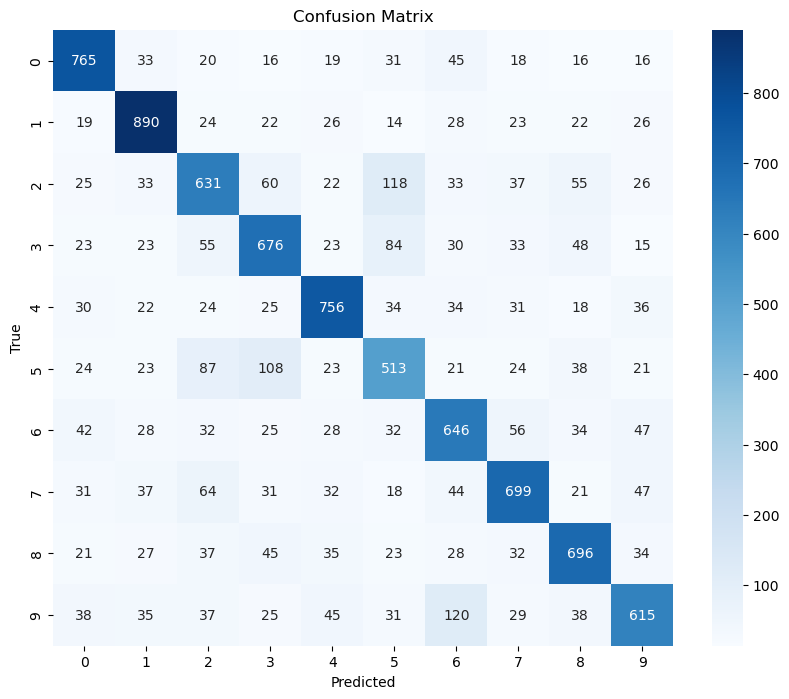

Test Loss: 1.226693 | Test Accuracy: 68.8700%
********************** End Calculations **********************



In [28]:
# Testing DenseNet on MNIST
print("Testing DenseNet_MNIST")
average_loss_denseNet_MNIST, accuracy_denseNet_MNIST, _, _, wrong_examples_denseNet_MNIST, true_labels_denseNet_MNIST, focal_denseNet_MNIST = test_model(denseNet_MNIST, testloader_mnist, criterion)

# Testing VGG19 on MNIST
print("Testing VGG19_MNIST")
average_loss_vgg19_MNIST, accuracy_vgg19_MNIST, _, _, wrong_examples_vgg19_MNIST, true_labels_vgg19_MNIST, focal_vgg19_MNIST = test_model(vgg19_MNIST, testloader_mnist, criterion)

# Testing ResNet on MNIST
print("Testing ResNet_MNIST")
average_loss_resNet_MNIST, accuracy_resNet_MNIST, _, _, wrong_examples_resNet_MNIST, true_labels_resNet_MNIST, focal_resNet_MNIST = test_model(resNet_MNIST, testloader_mnist, criterion)

# Testing MobileNetV2 on MNIST
print("Testing MobileNetV2_MNIST")
average_loss_mobileNetV2_MNIST, accuracy_mobileNetV2_MNIST, _, _, wrong_examples_mobileNetV2_MNIST, true_labels_mobileNetV2_MNIST, focal_mobileNetV2_MNIST = test_model(mobileNetV2_MNIST, testloader_mnist, criterion)

In [29]:
def run_all_ensembles_mnist():
    # Ensemble combinations: 123, 124, 134, 234
    print("Testing Ensemble 123 (DenseNet_MNIST, VGG19_MNIST, ResNet_MNIST)")
    run_ensemble_experiment([denseNet_MNIST, vgg19_MNIST, resNet_MNIST], testloader_mnist)

    print("Testing Ensemble 124 (DenseNet_MNIST, VGG19_MNIST, MobileNetV2_MNIST)")
    run_ensemble_experiment([denseNet_MNIST, vgg19_MNIST, mobileNetV2_MNIST], testloader_mnist)

    print("Testing Ensemble 134 (DenseNet_MNIST, ResNet_MNIST, MobileNetV2_MNIST)")
    run_ensemble_experiment([denseNet_MNIST, resNet_MNIST, mobileNetV2_MNIST], testloader_mnist)

    print("Testing Ensemble 234 (VGG19_MNIST, ResNet_MNIST, MobileNetV2_MNIST)")
    run_ensemble_experiment([vgg19_MNIST, resNet_MNIST, mobileNetV2_MNIST], testloader_mnist)


Testing Ensemble 123 (DenseNet_MNIST, VGG19_MNIST, ResNet_MNIST)


/storage/ice1/1/2/spadmanabha3/satkp/BigData/assignment4/conda/bda_4/lib/python3.9/site-packages/torch/utils/data/dataloader.py:478: UserWarning: This DataLoader will create 2 worker processes in total. Our suggested max number of worker in current system is 1, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Ensemble Test Accuracy: 77.8200%


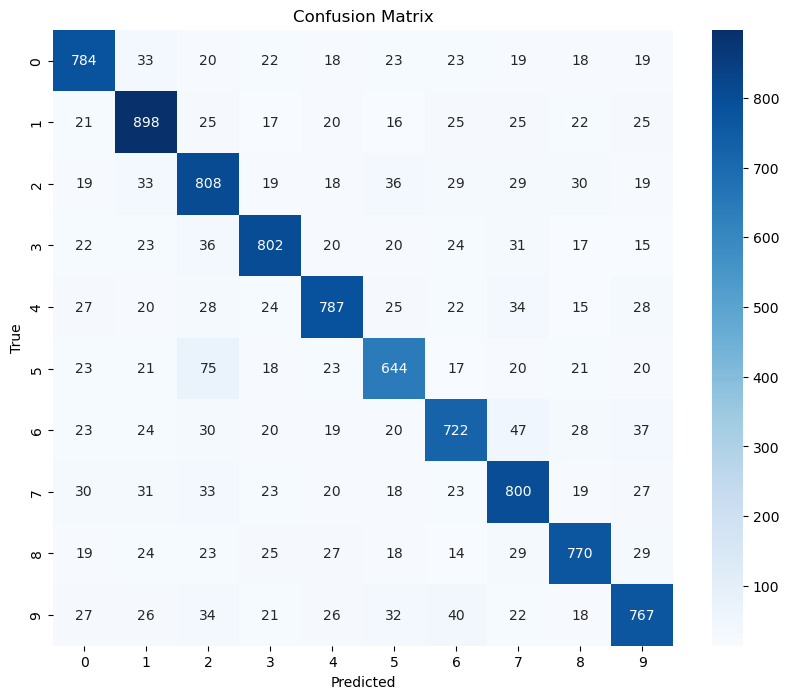

Testing Ensemble 124 (DenseNet_MNIST, VGG19_MNIST, MobileNetV2_MNIST)


/storage/ice1/1/2/spadmanabha3/satkp/BigData/assignment4/conda/bda_4/lib/python3.9/site-packages/torch/utils/data/dataloader.py:478: UserWarning: This DataLoader will create 2 worker processes in total. Our suggested max number of worker in current system is 1, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Ensemble Test Accuracy: 77.1900%


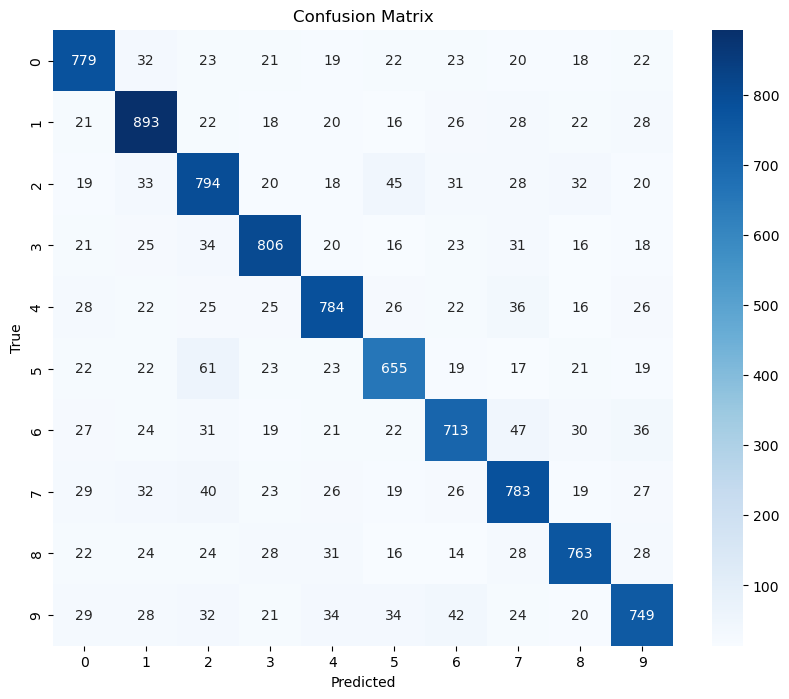

Testing Ensemble 134 (DenseNet_MNIST, ResNet_MNIST, MobileNetV2_MNIST)


/storage/ice1/1/2/spadmanabha3/satkp/BigData/assignment4/conda/bda_4/lib/python3.9/site-packages/torch/utils/data/dataloader.py:478: UserWarning: This DataLoader will create 2 worker processes in total. Our suggested max number of worker in current system is 1, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Ensemble Test Accuracy: 76.7700%


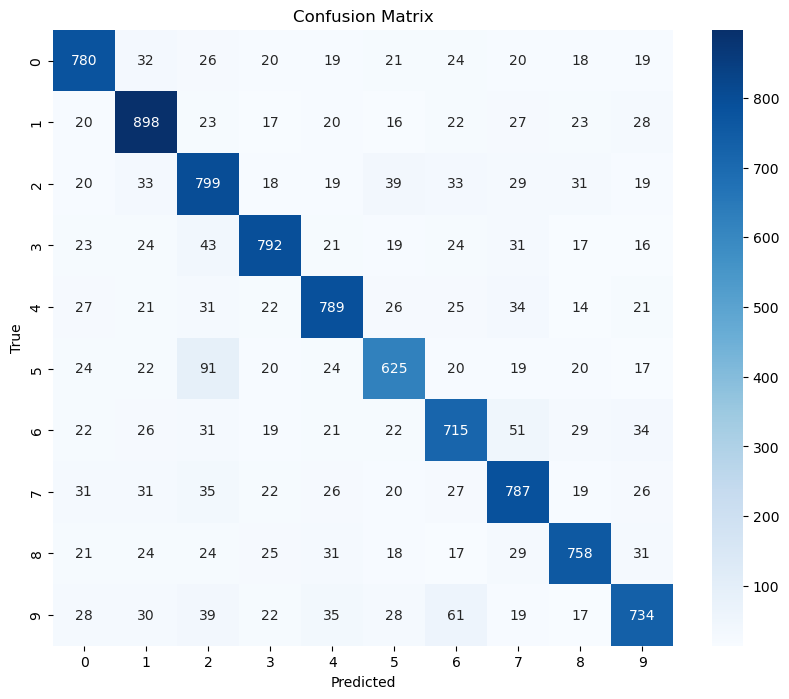

Testing Ensemble 234 (VGG19_MNIST, ResNet_MNIST, MobileNetV2_MNIST)


/storage/ice1/1/2/spadmanabha3/satkp/BigData/assignment4/conda/bda_4/lib/python3.9/site-packages/torch/utils/data/dataloader.py:478: UserWarning: This DataLoader will create 2 worker processes in total. Our suggested max number of worker in current system is 1, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


Ensemble Test Accuracy: 77.0600%


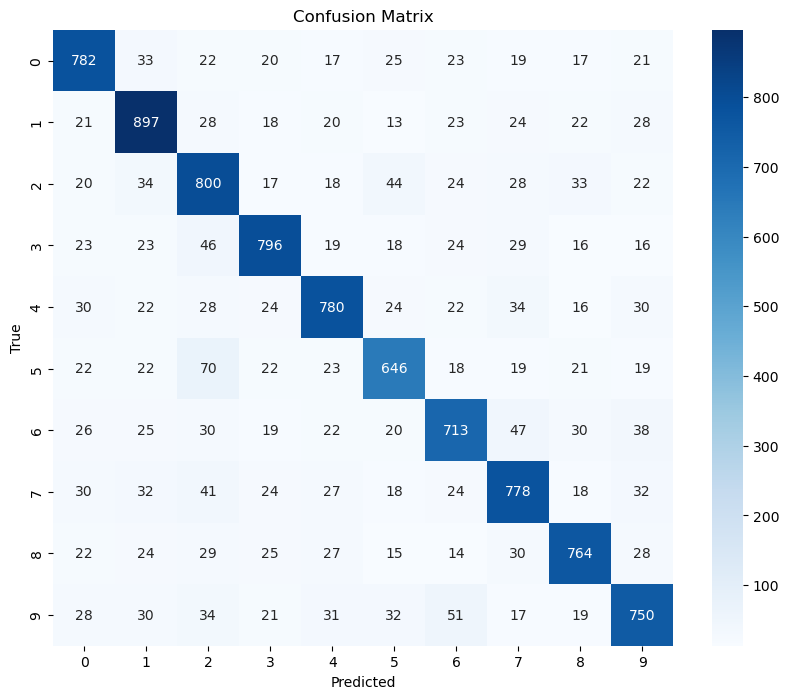

In [30]:
run_all_ensembles_mnist()